# Load packages and data

In [1]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import networkx as nx
import collections
import itertools
import seaborn as sns

from networkx.drawing.nx_agraph import write_dot, graphviz_layout
import matplotlib.pyplot as plt

import toverboom
import toverboom.optimizeLayout
import toverboom.lineageGraph

import random

import scanpy as sc
dpi = 50
sc.set_figure_params(dpi=dpi, color_map = 'viridis')

import scipy

In [2]:
import pygraphviz

### Import scar data:

In [3]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Scar_analysis/20201001_FACS5_scGastruloid_VAN5043/'
df = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataframeForHeatmap_All.pickle.gz')


In [4]:
#to load dataframes containing all calculated percentages again
percentagesChr12_129 = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFramepercentagesChr12_129.pickle.gz')
percentagesChr12_B6 = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFramepercentagesChr12_B6.pickle.gz')
percentagesChr12_NA = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFramepercentagesChr12_NA.pickle.gz')

#to load dataframes containing all allele counts again
alleleCountsChr12_129PD = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFrameAlleleCountsChr12_129.pickle.gz')
alleleCountsChr12_B6PD = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFrameAlleleCountsChr12_B6.pickle.gz')
alleleCountsChr12_NAPD = pd.read_pickle(pathToData + 'dataframes/VAN5043_dataFrameAlleleCountsChr12_NA.pickle.gz')

In [5]:
df.head()

129, 114682729 129, 114708745 129, 114781506 129, 114788469  \
A8 Q1_1               WT             WT             WT             WT   
   Q1_10              WT             WT             WT             WT   
   Q1_100             WT             WT             WT    114788552.D   
   Q1_101            NaN            NaN            NaN            NaN   
   Q1_102             WT             WT             WT             WT   

          129, 114809518 129, 114809526 129, 114817194 129, 114829361  \
A8 Q1_1               WT             WT             WT             WT   
   Q1_10              WT             WT             WT             WT   
   Q1_100             WT             WT             WT             WT   
   Q1_101            NaN            NaN            NaN            NaN   
   Q1_102             WT             WT             WT             WT   

          129, 114843748 129, 114879985  ... nonallelic, 114946131  \
A8 Q1_1    T.114843830.I             WT  ...                   NaN   
   Q1_10             NaN             WT  ...                   NaN   
   Q1_100            NaN             WT  ...                   NaN   
   Q1_101            NaN            NaN  ...                   NaN   
   Q1_102            NaN             WT  ...                   NaN   

          nonallelic, 114937297 nonallelic, 114788506 nonallelic, 114708859  \
A8 Q1_1                     NaN                   NaN                   NaN   
   Q1_10                    NaN                   NaN                   NaN   
   Q1_100                   NaN                   NaN                   NaN   
   Q1_101                   NaN                   NaN                   NaN   
   Q1_102                   NaN                   NaN                   NaN   

          nonallelic, 114937312 nonallelic, 114896333 nonallelic, 114817262  \
A8 Q1_1                     NaN                   NaN                   NaN   
   Q1_10                    NaN                   NaN                   NaN   
   Q1_100                   NaN                   NaN                   NaN   
   Q1_101                   NaN                   NaN                   NaN   
   Q1_102                   NaN                   NaN                   NaN   

          nonallelic, 114937311 nonallelic, 114672163 nonallelic, 114788619  
A8 Q1_1                     NaN                   NaN                   NaN  
   Q1_10                    NaN                   NaN                   NaN  
   Q1_100                   NaN                   NaN                   NaN  
   Q1_101                   NaN                   NaN                   NaN  
   Q1_102                   NaN                   NaN                   NaN  

[5 rows x 572 columns]

### Import transcriptome data:

In [6]:
cells_clusters = pd.read_csv('20220128_cells_clusters_FACS5.csv', sep = '\t')

In [7]:
cells_clusters.head()

,Unnamed: 0,leiden,umap_V1,umap_V2,cellname,gastruloid,celltype,louvain_colors
0,A1_1.1,2,-5.006134,9.371371,A1_1,B11,Heart Progenitors,red
1,A1_10.1,9,-0.478875,5.936601,A1_10,B11,Mesoderm,orchid
2,A1_100.1,7,-4.578000,2.349790,A1_100,B11,Neurons,forestgreen
3,A1_101.1,7,-2.722570,3.385981,A1_101,B11,Neurons,forestgreen
4,A1_102.1,7,-3.568954,1.970204,A1_102,B11,Neurons,forestgreen


# Define pre-scarred regions, definitions for graph construction, tree building, and tree visualisation:

Check the most common scars for a certain allele/site

In [8]:
mostCommonScars = {scar:collections.Counter(df[scar]).most_common(1) for scar in df}

In [9]:
mostCommonScarsdf = pd.DataFrame(mostCommonScars).T
mostCommonScarsdf.head(10)

,0
"129, 114682729","(WT, 3460)"
"129, 114708745","(WT, 3738)"
"129, 114781506","(WT, 3635)"
"129, 114788469","(WT, 3091)"
"129, 114809518","(WT, 3735)"
"129, 114809526","(WT, 3656)"
"129, 114817194","(WT, 3639)"
"129, 114829361","(WT, 2821)"
"129, 114843748","(T.114843830.I, 479)"
"129, 114879985","(WT, 3660)"


Print all alleleSites where the same scar has been counted >20 times to check for pre-scarred sites.

In [10]:
for x in mostCommonScarsdf.items():
    for (site,count) in x[1].items():
        if count[0] != 'WT' and count[1] > 20:
            print(site,count)

129, 114843748 ('T.114843830.I', 479)
129, 114896335 ('114896485.D', 3437)
129, 114788478 ('114788517.D,114788518.D,114788519.D,114788520.D,114788521.D', 51)
B6, 114708745 ('114708792.D,114708793.D,114708794.D,114708795.D,114708796.D,114708797.D,114708798.D,114708799.D,114708800.D,114708801.D', 1263)
nonallelic, 116009756 ('116009771.D,116009772.D', 621)


Set a pre-scarred pattern for the gastruloids that are pre-scarred

In [11]:
# Set pre-scar pattern:
# there are none
pre_scar_pattern = {  
    #'129, 114788469': '114788523.D,114788524.D,114788525.D,114788526.D,114788527.D',
    #'B6, 114788469': '114788523.D,114788524.D,114788525.D,114788526.D,114788527.D',
   # 'B6, 114740505': '114740560.D'
   # 'B6, 114746370':'114746424.D,114746425.D,114746426.D,114746427.D,114746428.D', 
}



First we need to select which sites to use. We know where the gRNA target sites are located, this is our selection. We then need to filter out the sites with too little coverage. For now we also do not use nonallelic

In [12]:
df.columns = df.columns.str.replace("nonallelic", "NA")

In [13]:
# these are all scar target sites
targetsites = ['129, 114682729', 'B6, 114682729', 'NA, 114682729',
                          '129, 114708745', 'B6, 114708745', 'NA, 114708745',
                          '129, 114723869', 'B6, 114723869', 'NA, 114723869',
                          '129, 114736342', 'B6, 114736342', 'NA, 114736342',
                          '129, 114740505', 'B6, 114740505', 'NA, 114740505',
                          '129, 114746370', 'B6, 114746370', 'NA, 114746370',
                          '129, 114788469', 'B6, 114788469', 'NA, 114788469',
                          '129, 114843748', 'B6, 114843748', 'NA, 114843748',
                          '129, 114851288', 'B6, 114851288', 'NA, 114851288',
                          '129, 114879985', 'B6, 114879985', 'NA, 114879985',
                          '129, 114896335', 'B6, 114896335', 'NA, 114896335',
                         '129, 114910169', 'B6, 114910169', 'NA, 114910169',
                         '129, 114914696', 'B6, 114914696', 'NA, 114914696']

In [14]:
# select scar target sites that survived all filtering steps:
found_targetsites = []
for site in targetsites:
    if site in df.columns:
        found_targetsites.append(site)

In [15]:
# these sites are found
found_targetsites

['129, 114682729',
 'B6, 114682729',
 'NA, 114682729',
 '129, 114708745',
 'B6, 114708745',
 'NA, 114708745',
 '129, 114723869',
 'B6, 114723869',
 'NA, 114723869',
 '129, 114736342',
 'B6, 114736342',
 'NA, 114736342',
 '129, 114740505',
 'B6, 114740505',
 'NA, 114740505',
 '129, 114746370',
 'B6, 114746370',
 'NA, 114746370',
 '129, 114788469',
 'B6, 114788469',
 'NA, 114788469',
 '129, 114843748',
 'B6, 114843748',
 'NA, 114843748',
 '129, 114851288',
 'B6, 114851288',
 'NA, 114851288',
 '129, 114879985',
 'B6, 114879985',
 '129, 114896335',
 'B6, 114896335',
 'NA, 114896335',
 '129, 114914696',
 'B6, 114914696']

In [16]:
selectionAll = df[found_targetsites] 
selectionAll

129, 114682729 B6, 114682729 NA, 114682729 129, 114708745  \
A8 Q1_1               WT            WT           NaN             WT   
   Q1_10              WT           NaN           NaN             WT   
   Q1_100             WT            WT           NaN             WT   
   Q1_101            NaN            WT           NaN            NaN   
   Q1_102             WT            WT           NaN             WT   
...                  ...           ...           ...            ...   
C1 Z1_95              WT            WT           NaN             WT   
   Z1_96              WT            WT            WT             WT   
   Z1_97             NaN            WT           NaN             WT   
   Z1_98              WT           NaN           NaN            NaN   
   Z1_99              WT            WT           NaN             WT   

                                               B6, 114708745 NA, 114708745  \
A8 Q1_1                                                  NaN           NaN   
   Q1_10   114708792.D,114708793.D,114708794.D,114708795....           NaN   
   Q1_100  114708792.D,114708793.D,114708794.D,114708795....           NaN   
   Q1_101  114708792.D,114708793.D,114708794.D,114708795....           NaN   
   Q1_102  114708792.D,114708793.D,114708794.D,114708795....           NaN   
...                                                      ...           ...   
C1 Z1_95                                                 NaN           NaN   
   Z1_96                                                 NaN            WT   
   Z1_97   114708792.D,114708793.D,114708794.D,114708795....           NaN   
   Z1_98                                                 NaN           NaN   
   Z1_99                                                 NaN           NaN   

                                              129, 114723869  \
A8 Q1_1                                                   WT   
   Q1_10                                                  WT   
   Q1_100                                                 WT   
   Q1_101                                                NaN   
   Q1_102                                                 WT   
...                                                      ...   
C1 Z1_95                                                  WT   
   Z1_96                                                  WT   
   Z1_97   114723925.D,114723926.D,114723927.D,114723928....   
   Z1_98                                                  WT   
   Z1_99                                                  WT   

                                               B6, 114723869 NA, 114723869  \
A8 Q1_1                                                  NaN            WT   
   Q1_10                                                  WT            WT   
   Q1_100                                                 WT           NaN   
   Q1_101                                                NaN           NaN   
   Q1_102                                                 WT            WT   
...                                                      ...           ...   
C1 Z1_95                                                  WT            WT   
   Z1_96                                                  WT            WT   
   Z1_97   114723923.D,114723924.D,114723925.D,114723926....           NaN   
   Z1_98                                                 NaN            WT   
   Z1_99                                                 NaN            WT   

          129, 114736342  ... 129, 114851288 B6, 114851288 NA, 114851288  \
A8 Q1_1              NaN  ...            NaN           NaN           NaN   
   Q1_10             NaN  ...            NaN           NaN           NaN   
   Q1_100            NaN  ...            NaN           NaN           NaN   
   Q1_101            NaN  ...            NaN           NaN           NaN   
   Q1_102             WT  ...            NaN           NaN           NaN   
...                  ...  ...            ...           ...

### Filtering

Remove alleleSites with too much missing data. If a site has >80% missing data it is kicked out.

In [17]:
# remove sites with too many NAs
percentage = 0.60 # this removes every alleleSite with > 60% NAs
for site,value in (selectionAll.isna().sum(axis=0)/len(selectionAll) < percentage).items():
    if value == False:
        selectionAll = selectionAll.drop(columns=site)
    

In [54]:
percWT = 0.80
for site in selectionAll:
    percentWT = (selectionAll[site] == 'WT').sum()/len(selectionAll[site])
    if percentWT > percWT:
        selectionAll = selectionAll.drop(columns=site)

#### Remove cells which only contain WT or too many NAs

In [55]:
allCounts = {cell:collections.Counter(selectionAll.loc[cell]) for cell in selectionAll.index}

In [56]:
percentageWT = 0.9
percentageNA = 0.6
for cell in selectionAll.index:
    if len(selectionAll.loc[cell].dropna()) == 0:
        selectionAll = selectionAll.drop(index=cell) ##if cell only has NAs, remove
    elif (1-len(selectionAll.loc[cell].dropna())/len(selectionAll.loc[cell])) > percentageNA: 
        selectionAll = selectionAll.drop(index=cell) ## if cell has >x NAs, remove
    elif (allCounts[cell]['WT'] / len(selectionAll.loc[cell].dropna())) >= percentageWT: 
            selectionAll = selectionAll.drop(index=cell) ## if cell has >x WT, remove

In [57]:
selectionAll

129, 114682729 B6, 114682729  \
A8 Q1_10              WT           NaN   
   Q1_100             WT            WT   
   Q1_102             WT            WT   
   Q1_106             WT            WT   
   Q1_107             WT            WT   
...                  ...           ...   
C1 Z1_8               WT           NaN   
   Z1_83              WT           NaN   
   Z1_87              WT            WT   
   Z1_90              WT            WT   
   Z1_94              WT            WT   

                                               B6, 114708745 129, 114723869  \
A8 Q1_10   114708792.D,114708793.D,114708794.D,114708795....             WT   
   Q1_100  114708792.D,114708793.D,114708794.D,114708795....             WT   
   Q1_102  114708792.D,114708793.D,114708794.D,114708795....             WT   
   Q1_106  114708792.D,114708793.D,114708794.D,114708795....             WT   
   Q1_107                                                NaN             WT   
...                                                      ...            ...   
C1 Z1_8                                                  NaN             WT   
   Z1_83                                                 NaN            NaN   
   Z1_87   114708792.D,114708793.D,114708794.D,114708795....             WT   
   Z1_90                                                 NaN             WT   
   Z1_94   114708792.D,114708793.D,114708794.D,114708795....             WT   

          NA, 114723869 B6, 114740505 129, 114788469 129, 114896335  \
A8 Q1_10             WT            WT             WT    114896485.D   
   Q1_100           NaN            WT    114788552.D            NaN   
   Q1_102            WT            WT             WT    114896485.D   
   Q1_106            WT            WT             WT    114896485.D   
   Q1_107           NaN            WT             WT    114896485.D   
...                 ...           ...            ...            ...   
C1 Z1_8              WT            WT            NaN    114896485.D   
   Z1_83             WT            WT             WT    114896485.D   
   Z1_87             WT            WT            NaN    114896485.D   
   Z1_90             WT            WT             WT    114896485.D   
   Z1_94             WT           NaN             WT    114896485.D   

          B6, 114896335 NA, 114896335 129, 114914696  
A8 Q1_10             WT            WT            NaN  
   Q1_100            WT           NaN            NaN  
   Q1_102            WT            WT             WT  
   Q1_106            WT            WT             WT  
   Q1_107            WT           NaN            NaN  
...                 ...           ...            ...  
C1 Z1_8              WT           NaN            NaN  
   Z1_83            NaN            WT            NaN  
   Z1_87             WT            WT            NaN  
   Z1_90            NaN            WT            NaN  
   Z1_94             WT            WT            NaN  

[1658 rows x 11 columns]

#### Compare the remaining scars with those found in other datasets and discard common scars
In this case, we compare the dataset to the ESC bulk samples from the dynamic data

In [58]:
# list of scars in this gastruloid datset
listofscars = {scar:collections.Counter(selectionAll[scar].dropna()) for scar in selectionAll}

### Definition for graph construction, tree building and tree visualisation:

We first need to define the colours based on the full dataset, to make sure that in all trees, the same scars have the same colours.

In [59]:
### First: define colours based on total set of scars across all gastruloids
cmap = plt.get_cmap('nipy_spectral')
#cmap = plt.get_cmap('gist_rainbow')
scarColors = {}

for alleleSite in df:
    site = alleleSite.split(',')[1]
    uniqueScars = df[alleleSite].unique()
    random.seed(3.1415927)
    random.shuffle(uniqueScars)    
    scarColorsPerSite = { scar: cmap(x) for scar, x in zip(uniqueScars, np.linspace(0,1, len(uniqueScars))) }
    scarColorsPerSite.update({'WT':(0,0,0),'nan':'#999999',
                              '114788523.D,114788524.D,114788525.D,114788526.D,114788527.D' : '#e98805' ,
                              '114740560.D' : '#0E8700'})
    scarColors.update(scarColorsPerSite)

In [60]:
len(scarColors.keys())

965

In [61]:
for scar in percentagesChr12_129.index.levels[1].unique():
    if scar not in scarColors.keys():
        uniqueScars = scar
        #for scars, x in zip([uniqueScars], np.linspace(0,1, len([uniqueScars]))):
        scarColorNew = { scar: cmap(x) for scar, x in zip([uniqueScars], np.linspace(0,1, len([uniqueScars]))) }
        scarColors.update(scarColorNew)

In [62]:
for scar in percentagesChr12_129.index.levels[1].unique():
    if scar not in scarColors.keys():
        print(scar)

In [63]:
# Save
#np.save(pathToData + 'scarColors_filteredData.npy', scarColors) 

In [64]:
# Load
test_scarColors = np.load('/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Scar_analysis/20200511_AllScarData_Remapped_MaskedRef_alteredAlleles/120hAA_VAN2988_SQ98/dataframes/scarColors_SQfilteredData.npy',allow_pickle='TRUE').item()


In [65]:
#update scarcolors with previously made dictionary:
scarColors.update(test_scarColors)

In [66]:
def makeTree(gastruloid, selections = selectionAll, cells_clusters = cells_clusters, 
             showAllPlots = False, scarColors = scarColors,
             transcriptomeColours = 'louvain_colors'):
    
    ## subset gastruloid
    selection = selections.loc[gastruloid]
    
    ###### First: construct ancestry graph ######
    
    #construct graph
    ancestry_graph = nx.DiGraph()
    
    for cell_name,row in selection.iterrows():
        state_node = {
        site:scar for site, scar in row.iteritems() #if not 'nonallelic' in site
        }
        scar_vector = tuple( str(scar) for site, scar in row.iteritems() ) #if not 'nonallelic' in site )

        if scar_vector in ancestry_graph: # was already added
            ancestry_graph.node[scar_vector]['seen'] += 1
            ancestry_graph.node[scar_vector]['associated_cells'].append(cell_name)
        else:
            ancestry_graph.add_node(
                scar_vector,
                seen = 1,
                associated_cells=[cell_name],
                site_data=state_node
            )
                   
    # Filter nodes for seen > param
    remove = []
    for node in ancestry_graph:
        if ancestry_graph.node[node]['seen'] < 2 and node.count('nan') > 1:
            remove.append(node)
            
    ancestry_graph.remove_nodes_from(remove)

    scar_vector_order = list(selection.columns)

    # Add wildtype node:
    state_node = {
        site:pre_scar_pattern.get(site,'WT') for site, scar in row.iteritems() #if not 'nonallelic' in site
    }

    root_node = tuple( pre_scar_pattern.get(site,'WT') for site, scar in row.iteritems() ) #if not 'nonallelic' in site )
    
    # filter out nodes that have different scars than the pre-scars
    remove_node = []
    for node in ancestry_graph:
        for site,scar in pre_scar_pattern.items():
            if ancestry_graph.node[node]['site_data'][site] != scar and pd.isna(ancestry_graph.node[node]['site_data'][site]) == False:
                remove_node.append(node)

    ancestry_graph.remove_nodes_from(remove_node)
    scar_vector_order = list(selection.columns)
    
    ancestry_graph.add_node(
        root_node,
        seen = 0,
        associated_cells=[],
        site_data=state_node,
        is_root=True   
        )

    def is_null(value):
        if pd.isnull(value):
            return True
        return value=='nan'

    def is_wt(value):
        return value=='WT' and not is_null(value)

    def is_scar(value):
        return not is_null(value) and not is_wt(value)

    def scar_distance(from_scar, to_scar, ancestry_graph, root_node ):
        # It is no allowed to enter the root node from another state
            # Check if we go from a WT site to a scar
        if to_scar == root_node:
            return None
        
        #print(f'{from_scar} > {to_scar}')
        distance = 0
        for site, from_scar_state in ancestry_graph.node[from_scar]['site_data'].items():
            to_scar_state = ancestry_graph.node[to_scar]['site_data'][site]
        
            increment = 0
            if  is_wt(from_scar_state) and is_wt(to_scar_state):
                 increment = 0 # no cost from WT to WT
            
            elif  is_scar(from_scar_state) and is_scar(to_scar_state) and to_scar_state==from_scar_state:
                increment = 0 # no cost from SCAR to SCAR if they are identical
            
            elif is_wt(from_scar_state) and is_scar(to_scar_state):
                increment = 1
            
            # Check if we go from scar to WT.. that is impossible
            elif is_scar(from_scar_state) and is_wt(to_scar_state):
                increment = None

            # Check if the from_scar is a subset of the to_scar:
            else:
                # Allow to go from non-na to na 
                if  not is_null(from_scar_state)  and is_null(to_scar_state) :
                    increment =1
                else:
                    increment = None
                #if set(from_scar_state.split(',') ).issubset(  set(to_scar_state.split(',') )):
                #    distance+=1.5
            #print(f'\t{site} {from_scar_state}->{to_scar_state} = {increment}')
        
            if increment is None:
                return None
            distance += increment
        
        return distance    
    
    for from_scar, to_scar in itertools.product(ancestry_graph.node, repeat=2) :
        # Calculate distance between two nodes:
        distance = scar_distance(from_scar, to_scar, ancestry_graph, root_node=root_node )
        if distance is None:
            #print(f"Not making edge between root_node and {from_scar}")
            pass
        else:
            ancestry_graph.add_edge(from_scar,to_scar, distance=distance)
            ancestry_graph.add_edge(from_scar,to_scar, weight= distance)
        
    for from_node,to_node in ancestry_graph.edges():
        if to_node==root_node:
            print(from_node, to_node)
    
    pos = nx.spring_layout(ancestry_graph)
    
    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(ancestry_graph, pos)
        plt.show()
    
    
    ###### Then: construct spanning_arb ######
    
    
    spanning_arb = nx.algorithms.tree.branchings.Edmonds( ancestry_graph ).find_optimum(
        style='arborescence', 
        kind='min',
        default=0,
          preserve_attrs=True
    )

    # Manually copy attributes:
    for node in spanning_arb:
        spanning_arb.node[node].update( ancestry_graph.node[node] )
        
    # Now copy all only nan changes into their parent..
    changed=True
    while changed:
        changed=False
        for node in spanning_arb:
            if nx.degree(spanning_arb, node)==0:
                continue
            if len( list(spanning_arb.successors(node)) )==0:
                # we are inside a leaf:
                #comapre ourself to parent:
                parent = list(spanning_arb.predecessors(node))[0]
                # check if distance is caused by nan
                if not any( list( not( (a==b) or  (is_null(a) or is_null(b)) ) for a,b in  zip(parent,node) ) ):
                    # we should merge to parent:
                    spanning_arb.node[parent]['associated_cells'] += spanning_arb.node[node]['associated_cells']
                    spanning_arb.node[parent]['seen'] += spanning_arb.node[node]['seen']
                    spanning_arb.remove_node(node)
                    changed=True
                    break
    
    pos = nx.spring_layout(spanning_arb)
    
    #spanning_arb.node[list(spanning_arb)[0]]
   
    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(spanning_arb, pos)
        plt.show()
    
    
    ###### Then: clean up graph ######
    
    def format_node_name(node):
        return '_'.join(node)

    clean_graph = nx.DiGraph()
    for node in spanning_arb:
        sites_modified = {
            'AAP'+str(site).replace(', ','X'):str(scar)
            for site,scar in ancestry_graph.node[node]['site_data'].items()
            if not is_null(scar)    
        }
        
        clean_graph.add_node(format_node_name(node), 
                             associatedCells ='_'.join( ancestry_graph.node[node]['associated_cells'] ),  
                             totalCells = ancestry_graph.node[node]['seen'],
                             changes=format_node_name(node).count('.'),
                             wildTypes=format_node_name(node).count('WT'),
                             nans=format_node_name(node).count('nan'),
                             isRoot=ancestry_graph.node[node].get('is_root',False),
                                **sites_modified
                            )

    for a,b in spanning_arb.edges():
        clean_graph.add_edge(
            format_node_name(a),
            format_node_name(b),  
            scarDistance=ancestry_graph[a][b]['distance'])

    #nx.write_gml(clean_graph,'scar_graph.gml')
    

    ###### Then: create expanded graph ######
    
    # Create pseudo timepoint expansion

    # detect depth of tree (max len path) + 1
    pseudo_timepoint_len = len( nx.algorithms.dag.dag_longest_path(spanning_arb, weight='NONE') ) + 1

    expanded_graph = nx.DiGraph()
    expanded_graph.add_node( (root_node,0), 
                            radius=1, first_tp = 0,
                            **ancestry_graph.node[root_node] )

    for node in spanning_arb:
        # the first pseudotimepoint of the node is at the distance to the root 
        try:
            if node == root_node:
                first_tp = 0
            else:
                first_tp = nx.shortest_path_length( spanning_arb, root_node, node )
            prev = None
            # expand the node to every timepoint until the end of pseudotime:
            for tp in range(first_tp,pseudo_timepoint_len):
                expanded_graph.add_node( (node,tp), 
                                        radius=ancestry_graph.node[node]['seen'], first_tp = first_tp,
                                        **ancestry_graph.node[node] )
                spanning_arb.node[node]['first_tp'] = first_tp
                if prev is not None:
                    expanded_graph.add_edge( prev, (node,tp) )
                prev = (node,tp) 
        except nx.NetworkXNoPath:
            continue
    # Now create inter-clone edges:
    for from_node, to_node in spanning_arb.edges():
        to_tp = spanning_arb.node[to_node]['first_tp']
        from_tp = to_tp - 1
        expanded_graph.add_edge((from_node,from_tp) , (to_node,to_tp))
         
    # same layout using matplotlib with no labels
    pos = graphviz_layout(expanded_graph, prog='dot')

    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(expanded_graph, pos)
        plt.show()

    expanded_graph[root_node,0]

    expanded_graph = nx.algorithms.tree.branchings.Edmonds( expanded_graph ).find_optimum(
        style='arborescence', 
        kind='min',
        preserve_attrs=True,
        default=0,
    )
    
# Copy attributes because preserve_attrs is not working
    for node,tp in expanded_graph:
        expanded_graph.node[node,tp]['radius'] = ancestry_graph.node[node]['seen']
    
    # same layout using matplotlib with no labels
    pos = graphviz_layout(expanded_graph, prog='dot')

    initial_order = [(state) for state, tp in pd.DataFrame(pos).T.sort_values(0).index]
    seen = set()
    initial_order = [x for x in initial_order if (x not in seen) and not seen.add(x)]

    #expanded_graph.node[list(expanded_graph)[1]]
 

    ###### Create toverboom topology ######
    
    # Instantiate the lineage graph object
    lg = toverboom.lineageGraph.LineageGraph(expanded_graph)

    for node in lg.graph:
        if len(list(lg.graph.successors(node)))==0:
            lg.graph.node[node]['leaf'] = True
        else:
            lg.graph.node[node]['leaf'] = False

    # Create a figure for our plot:
    fig, ax = plt.subplots()

    # Find the best layout
    toverboom.optimizeLayout.optimize_layout(lg,
                                             visualize_progress_ax=ax, 
                                             visualize_progress_fig=fig,
                                             #initial_order=initial_order ,no_optim=True     
                                            )
    pass


    ###### Make dataframe that is used as input for tree visualisation ######
    
    cellDataDict = collections.defaultdict(dict)
    for clone,tp in lg.graph:
        if tp==(pseudo_timepoint_len-1):
            lg.graph.node[(clone,tp)]['radius'] = len(ancestry_graph.node[clone]['associated_cells'])
        
            for cell in ancestry_graph.node[clone]['associated_cells']:
                cellDataDict[(clone,tp,cell)] = {'tp':tp, 'cluster':clone}
    
    cellData = pd.DataFrame(cellDataDict).T
    
    
    ###### Couple scar dataframe to transcriptome dataframe ######    
    
    cellData2 = cellData.copy()
    index = cellData2.reset_index()
    index['cellname'] = index['level_2']

    cellData2 = index.merge(cells_clusters, on = 'cellname')
    cellData2 = cellData2.set_index(['level_0','level_1','level_2'])

    def scale(coordinates,pc = 10):
        start = np.percentile(coordinates,pc) 
        end = np.percentile(coordinates,100-pc)
        return np.interp(coordinates, (start, end), (0.4, 1))

    cellData2['x']  = scale(cellData2['umap_V1'].fillna(0))
    cellData2['y'] = scale(cellData2['umap_V2'].fillna(0))

    
###### MAKE TREE #######

    cells = list(cellData.index)

    cellData2['x']-=1
    
    cellData2['size']= 15

    # Plot the polygons of the tree
    fig, ax = plt.subplots()

    # wavyness controls how wavy the segments of the tree are 
    wavyness=0.7
    # xDistance controls the stretch in the x direction 
    lg.xDistance= 10
    lg.verticalSpacing = 2

    lg.setRadiusAttributes(radiusAttribute='radius', 
                           defaultRadius=1, 
                           radiusMultiplier=0.2 )

    lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':0}, offsetCentroid=True)
    lg.plotPatches(ax=ax,wavyness=wavyness)

    # Remove plot spines:
    toverboom.lineageGraph.despine(ax)
    # Scale labels to plot size:
    toverboom.lineageGraph.format_x_axis_labels(ax)

    # Add labels to the clones:


    allClones = set([ cluster for cluster,tp in lg.graph ]) - set([0])
    bigClones = set([1,4,2,3,5])

    #cellData = cellCnvBarcode
    #cellData['tp'] = [passage for passage, plate, cell in list(cellData.index)]

    # Remove plot spines:
    toverboom.lineageGraph.despine(ax)

    # Scale labels to plot size:
    toverboom.lineageGraph.format_x_axis_labels(ax)

    # Add vertical lines to indicate sampled timepoints
    lg.plot_xticks(ax, [x for x in cellData2['tp'].unique()])
    lg.plot_vertical_lines(ax, cellData2['tp'].unique(), c='k')

    lg.plotSingleCells(ax=ax, cellData = cellData2,fig=fig, cellJitter = 4,
                       colorAttribute = transcriptomeColours,yOffsetAttribute='y',xOffsetAttribute='x',
                       yJitterRatio=2,defaultXOffset = 50,defaultYOffset = 50,
                       defaultLinewidth = 0.5)
    

    ax.set_xlabel('Pseudotime')

    x_start = lg.getXCoordinate(pseudo_timepoint_len) - 8
    rect_size = 3.5

    #lg.annotateNodes(ax=ax)

    maxY = max([y for clone,y in lg.getTrellisCoordinates().items()])
    for clone, y in lg.getTrellisCoordinates().items():
    
        for i,scar in enumerate(clone):
            x = x_start + (rect_size*i)
            if y ==  maxY:
                # show label of scar:
                ax.text( x+0.5*rect_size,y+5, scar_vector_order[i], ha='center',va='bottom', rotation=90, size='smaller')
            node_height = max(2,lg.getNodeRadius( node=(clone,pseudo_timepoint_len-1) )*2)
        
            ax.add_patch(
                matplotlib.patches.Rectangle((x, y-node_height*0.5), 
                                             rect_size,node_height,
                                             fc=scarColors.get(scar,'r'), label = scar_vector_order[i] + str(': ') + (scar[0:12] + str(' - ') + scar[-11:-1] + scar[-1])
                                    
                                            ),
        
            )

    ax.legend(ncol = 5, fontsize=5)

    def legend_without_duplicate_labels(ax):
        newUnique = []
        handles, labels = ax.get_legend_handles_labels()
        unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
        for site in scar_vector_order:
            for handles,labels in unique:
                if site in labels:
                    newUnique.append((handles,labels))
        ax.legend(*zip(*newUnique), fontsize = 6, loc='center right',bbox_to_anchor=(1.12,0.5))
    

    legend_without_duplicate_labels(ax)

    ax.get_yaxis().set_visible(False) 
    ax.set_xticklabels('')
    ax.set_xlabel('Pseudotime')
    ax.set_xlim(0, x_start + (rect_size*(i+5))) 
    ax.set_ylim(0,maxY+24) 

    fig.canvas.draw()
#
#plt.savefig('/Users/m.blotenburg/Desktop/120hAA_C5H11.png', dpi=500)
    

In [67]:
def makeTree(gastruloid, selections = selectionAll, cells_clusters = cells_clusters, 
             showAllPlots = False, scarColors = scarColors,
             transcriptomeColours = 'louvain_colors'):
    
    ## subset gastruloid
    selection = selections.loc[gastruloid]
    
    ###### First: construct ancestry graph ######
    
    #construct graph
    ancestry_graph = nx.DiGraph()
    
    for cell_name,row in selection.iterrows():
        state_node = {
        site:scar for site, scar in row.iteritems() #if not 'nonallelic' in site
        }
        scar_vector = tuple( str(scar) for site, scar in row.iteritems() ) #if not 'nonallelic' in site )

        if scar_vector in ancestry_graph: # was already added
            ancestry_graph.node[scar_vector]['seen'] += 1
            ancestry_graph.node[scar_vector]['associated_cells'].append(cell_name)
        else:
            ancestry_graph.add_node(
                scar_vector,
                seen = 1,
                associated_cells=[cell_name],
                site_data=state_node
            )
                   
    # Filter nodes for seen > param
    remove = []
    for node in ancestry_graph:
        if ancestry_graph.node[node]['seen'] < 2 and node.count('nan') > 1:
            remove.append(node)
            
    ancestry_graph.remove_nodes_from(remove)

    scar_vector_order = list(selection.columns)

    # Add wildtype node:
    state_node = {
        site:pre_scar_pattern.get(site,'WT') for site, scar in row.iteritems() #if not 'nonallelic' in site
    }

    root_node = tuple( pre_scar_pattern.get(site,'WT') for site, scar in row.iteritems() ) #if not 'nonallelic' in site )
    
    # filter out nodes that have different scars than the pre-scars
    remove_node = []
    for node in ancestry_graph:
        for site,scar in pre_scar_pattern.items():
            if ancestry_graph.node[node]['site_data'][site] != scar and pd.isna(ancestry_graph.node[node]['site_data'][site]) == False:
                remove_node.append(node)

    ancestry_graph.remove_nodes_from(remove_node)
    scar_vector_order = list(selection.columns)
    
    ancestry_graph.add_node(
        root_node,
        seen = 0,
        associated_cells=[],
        site_data=state_node,
        is_root=True   
        )

    def is_null(value):
        if pd.isnull(value):
            return True
        return value=='nan'

    def is_wt(value):
        return value=='WT' and not is_null(value)

    def is_scar(value):
        return not is_null(value) and not is_wt(value)

    def scar_distance(from_scar, to_scar, ancestry_graph, root_node ):
        # It is no allowed to enter the root node from another state
            # Check if we go from a WT site to a scar
        if to_scar == root_node:
            return None
        
        #print(f'{from_scar} > {to_scar}')
        distance = 0
        for site, from_scar_state in ancestry_graph.node[from_scar]['site_data'].items():
            to_scar_state = ancestry_graph.node[to_scar]['site_data'][site]
        
            increment = 0
            if  is_wt(from_scar_state) and is_wt(to_scar_state):
                 increment = 0 # no cost from WT to WT
            
            elif  is_scar(from_scar_state) and is_scar(to_scar_state) and to_scar_state==from_scar_state:
                increment = 0 # no cost from SCAR to SCAR if they are identical
            
            elif is_wt(from_scar_state) and is_scar(to_scar_state):
                increment = 1
            
            # Check if we go from scar to WT.. that is impossible
            elif is_scar(from_scar_state) and is_wt(to_scar_state):
                increment = None

            # Check if the from_scar is a subset of the to_scar:
            else:
                # Allow to go from non-na to na 
                if  not is_null(from_scar_state)  and is_null(to_scar_state) :
                    increment =1
                else:
                    increment = None
                #if set(from_scar_state.split(',') ).issubset(  set(to_scar_state.split(',') )):
                #    distance+=1.5
            #print(f'\t{site} {from_scar_state}->{to_scar_state} = {increment}')
        
            if increment is None:
                return None
            distance += increment
        
        return distance    
    
    for from_scar, to_scar in itertools.product(ancestry_graph.node, repeat=2) :
        # Calculate distance between two nodes:
        distance = scar_distance(from_scar, to_scar, ancestry_graph, root_node=root_node )
        if distance is None:
            #print(f"Not making edge between root_node and {from_scar}")
            pass
        else:
            ancestry_graph.add_edge(from_scar,to_scar, distance=distance)
            ancestry_graph.add_edge(from_scar,to_scar, weight= distance)
        
    for from_node,to_node in ancestry_graph.edges():
        if to_node==root_node:
            print(from_node, to_node)
    
    pos = nx.spring_layout(ancestry_graph)
    
    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(ancestry_graph, pos)
        plt.show()
    
    
    ###### Then: construct spanning_arb ######
    
    
    spanning_arb = nx.algorithms.tree.branchings.Edmonds( ancestry_graph ).find_optimum(
        style='arborescence', 
        kind='min',
        default=0,
          preserve_attrs=True
    )

    # Manually copy attributes:
    for node in spanning_arb:
        spanning_arb.node[node].update( ancestry_graph.node[node] )
        
    # Now copy all only nan changes into their parent..
    changed=True
    while changed:
        changed=False
        for node in spanning_arb:
            if nx.degree(spanning_arb, node)==0:
                continue
            if len( list(spanning_arb.successors(node)) )==0:
                # we are inside a leaf:
                #comapre ourself to parent:
                parent = list(spanning_arb.predecessors(node))[0]
                # check if distance is caused by nan
                if not any( list( not( (a==b) or  (is_null(a) or is_null(b)) ) for a,b in  zip(parent,node) ) ):
                    # we should merge to parent:
                    spanning_arb.node[parent]['associated_cells'] += spanning_arb.node[node]['associated_cells']
                    spanning_arb.node[parent]['seen'] += spanning_arb.node[node]['seen']
                    spanning_arb.remove_node(node)
                    changed=True
                    break
    
    pos = nx.spring_layout(spanning_arb)
    
    #spanning_arb.node[list(spanning_arb)[0]]
   
    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(spanning_arb, pos)
        plt.show()
    
    
    ###### Then: clean up graph ######
    
    def format_node_name(node):
        return '_'.join(node)

    clean_graph = nx.DiGraph()
    for node in spanning_arb:
        sites_modified = {
            'AAP'+str(site).replace(', ','X'):str(scar)
            for site,scar in ancestry_graph.node[node]['site_data'].items()
            if not is_null(scar)    
        }
        
        clean_graph.add_node(format_node_name(node), 
                             associatedCells ='_'.join( ancestry_graph.node[node]['associated_cells'] ),  
                             totalCells = ancestry_graph.node[node]['seen'],
                             changes=format_node_name(node).count('.'),
                             wildTypes=format_node_name(node).count('WT'),
                             nans=format_node_name(node).count('nan'),
                             isRoot=ancestry_graph.node[node].get('is_root',False),
                                **sites_modified
                            )

    for a,b in spanning_arb.edges():
        clean_graph.add_edge(
            format_node_name(a),
            format_node_name(b),  
            scarDistance=ancestry_graph[a][b]['distance'])

    #nx.write_gml(clean_graph,'scar_graph.gml')
    

    ###### Then: create expanded graph ######
    
    # Create pseudo timepoint expansion

    # detect depth of tree (max len path) + 1
    pseudo_timepoint_len = len( nx.algorithms.dag.dag_longest_path(spanning_arb, weight='NONE') ) + 1

    expanded_graph = nx.DiGraph()
    expanded_graph.add_node( (root_node,0), 
                            radius=1, first_tp = 0,
                            **ancestry_graph.node[root_node] )

    for node in spanning_arb:
        # the first pseudotimepoint of the node is at the distance to the root 
        try:
            if node == root_node:
                first_tp = 0
            else:
                first_tp = nx.shortest_path_length( spanning_arb, root_node, node )
            prev = None
            # expand the node to every timepoint until the end of pseudotime:
            for tp in range(first_tp,pseudo_timepoint_len):
                expanded_graph.add_node( (node,tp), 
                                        radius=ancestry_graph.node[node]['seen'], first_tp = first_tp,
                                        **ancestry_graph.node[node] )
                spanning_arb.node[node]['first_tp'] = first_tp
                if prev is not None:
                    expanded_graph.add_edge( prev, (node,tp) )
                prev = (node,tp) 
        except nx.NetworkXNoPath:
            continue
    # Now create inter-clone edges:
    for from_node, to_node in spanning_arb.edges():
        to_tp = spanning_arb.node[to_node]['first_tp']
        from_tp = to_tp - 1
        expanded_graph.add_edge((from_node,from_tp) , (to_node,to_tp))
         
    # same layout using matplotlib with no labels
    pos = graphviz_layout(expanded_graph, prog='dot')

    if showAllPlots == True:
        fig, ax = plt.subplots()
        nx.draw_networkx(expanded_graph, pos)
        plt.show()

    expanded_graph[root_node,0]

    expanded_graph = nx.algorithms.tree.branchings.Edmonds( expanded_graph ).find_optimum(
        style='arborescence', 
        kind='min',
        preserve_attrs=True,
        default=0,
    )
    
# Copy attributes because preserve_attrs is not working
    for node,tp in expanded_graph:
        expanded_graph.node[node,tp]['radius'] = ancestry_graph.node[node]['seen']
    
    # same layout using matplotlib with no labels
    pos = graphviz_layout(expanded_graph, prog='dot')

    initial_order = [(state) for state, tp in pd.DataFrame(pos).T.sort_values(0).index]
    seen = set()
    initial_order = [x for x in initial_order if (x not in seen) and not seen.add(x)]

    #expanded_graph.node[list(expanded_graph)[1]]
 

    ###### Create toverboom topology ######
    
    # Instantiate the lineage graph object
    lg = toverboom.lineageGraph.LineageGraph(expanded_graph)

    for node in lg.graph:
        if len(list(lg.graph.successors(node)))==0:
            lg.graph.node[node]['leaf'] = True
        else:
            lg.graph.node[node]['leaf'] = False

    # Create a figure for our plot:
    fig, ax = plt.subplots()

    # Find the best layout
    toverboom.optimizeLayout.optimize_layout(lg,
                                             visualize_progress_ax=ax, 
                                             visualize_progress_fig=fig,
                                             #initial_order=initial_order ,no_optim=True     
                                            )
    pass


    ###### Make dataframe that is used as input for tree visualisation ######
    
    cellDataDict = collections.defaultdict(dict)
    for clone,tp in lg.graph:
        if tp==(pseudo_timepoint_len-1):
            lg.graph.node[(clone,tp)]['radius'] = len(ancestry_graph.node[clone]['associated_cells'])
        
            for cell in ancestry_graph.node[clone]['associated_cells']:
                cellDataDict[(clone,tp,cell)] = {'tp':tp, 'cluster':clone}
    
    cellData = pd.DataFrame(cellDataDict).T
    
    
    ###### Couple scar dataframe to transcriptome dataframe ######    
    
    cellData2 = cellData.copy()
    index = cellData2.reset_index()
    index['cellname'] = index['level_2']

    cellData2 = index.merge(cells_clusters, on = 'cellname')
    cellData2 = cellData2.set_index(['level_0','level_1','level_2'])

    def scale(coordinates,pc = 10):
        start = np.percentile(coordinates,pc) 
        end = np.percentile(coordinates,100-pc)
        return np.interp(coordinates, (start, end), (0.4, 1))

    cellData2['x']  = scale(cellData2['umap_V1'].fillna(0))
    cellData2['y'] = scale(cellData2['umap_V2'].fillna(0))
    
    return cellData2, lg, transcriptomeColours, scar_vector_order, pseudo_timepoint_len

In [68]:
import scanpy as sc
sc.set_figure_params(dpi=300, color_map = 'viridis')
sns.set_style('white')
sns.set_style('ticks')

In [69]:
def plotTree(cellData2, lg, transcriptomeColours, scar_vector_order, pseudo_timepoint_len, figsize = (15,15)):
    ###### MAKE TREE #######

    cells = list(cellData2.index)

    cellData2['x']-= 1
    
    cellData2['size']= 35

    # Plot the polygons of the tree
    fig, ax = plt.subplots(figsize = figsize)

    # wavyness controls how wavy the segments of the tree are 
    wavyness=0.7
    # xDistance controls the stretch in the x direction 
    lg.xDistance= 8.5
    lg.verticalSpacing = 1.5

    lg.setRadiusAttributes(radiusAttribute='radius', 
                           defaultRadius=1, 
                           radiusMultiplier=0.2 )

    lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':0}, offsetCentroid=True)
    lg.plotPatches(ax=ax,wavyness=wavyness)

    # Remove plot spines:
    toverboom.lineageGraph.despine(ax)
    # Scale labels to plot size:
    toverboom.lineageGraph.format_x_axis_labels(ax)

    # Add labels to the clones:


    allClones = set([ cluster for cluster,tp in lg.graph ]) - set([0])
    bigClones = set([1,4,2,3,5])

    #cellData = cellCnvBarcode
    #cellData['tp'] = [passage for passage, plate, cell in list(cellData.index)]

    # Remove plot spines:
    toverboom.lineageGraph.despine(ax)

    # Scale labels to plot size:
    toverboom.lineageGraph.format_x_axis_labels(ax)

    # Add vertical lines to indicate sampled timepoints
    lg.plot_xticks(ax, [x for x in cellData2['tp'].unique()])
    lg.plot_vertical_lines(ax, cellData2['tp'].unique(), c='k')

    lg.plotSingleCells(ax=ax, cellData = cellData2,fig=fig, cellJitter = 1,
                       colorAttribute = transcriptomeColours,yOffsetAttribute='y',xOffsetAttribute='x',
                       yJitterRatio=2,defaultXOffset = 5,defaultYOffset = 50,
                       defaultLinewidth = 0.5)
    

    ax.set_xlabel('Pseudotime')

    x_start = lg.getXCoordinate(pseudo_timepoint_len) - 8
    rect_size = 2.5

    #lg.annotateNodes(ax=ax)

    maxY = max([y for clone,y in lg.getTrellisCoordinates().items()])
    for clone, y in lg.getTrellisCoordinates().items():
    
        for i,scar in enumerate(clone):
            x = x_start + (rect_size*i)
            if y ==  maxY:
                # show label of scar:
                ax.text( x+0.5*rect_size,y+5, scar_vector_order[i], ha='left',va='bottom', rotation=45, size='smaller')
            node_height = max(2,lg.getNodeRadius( node=(clone,pseudo_timepoint_len-1) )*2)
        
            ax.add_patch(
                matplotlib.patches.Rectangle((x, y-node_height*0.5), 
                                             rect_size,node_height*1.2,
                                             fc=scarColors.get(scar,'r'), label = scar_vector_order[i] + str(': ') + (scar[0:12] + str(' - ') + scar[-11:-1] + scar[-1])
                                    
                                            ),
        
            )

    ax.legend(ncol = 5, fontsize=5)

    def legend_without_duplicate_labels(ax):
        newUnique = []
        handles, labels = ax.get_legend_handles_labels()
        unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
        for site in scar_vector_order:
            for handles,labels in unique:
                if site in labels:
                    newUnique.append((handles,labels))
        ax.legend(*zip(*newUnique), fontsize = 6, loc='center right',bbox_to_anchor=(1.12,0.5))
    

    legend_without_duplicate_labels(ax)
    ax.legend([], frameon=False)
    ax.get_yaxis().set_visible(False) 
    ax.set_xticklabels('')
    ax.set_xlabel('Pseudotime')
    ax.xaxis.set_label_coords(0.25, -0.025)
    ax.set_xlim(0, x_start + (rect_size*(i+1))) 
    ax.set_ylim(0,maxY+24) 

    fig.canvas.draw()
#
#plt.savefig('/Users/m.blotenburg/Desktop/120hAA_C5H11.png', dpi=500)



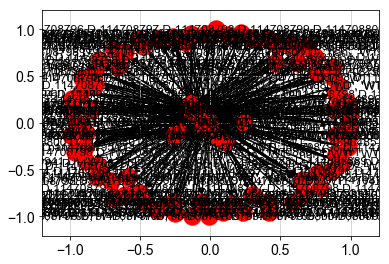

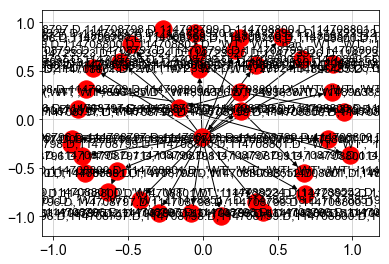

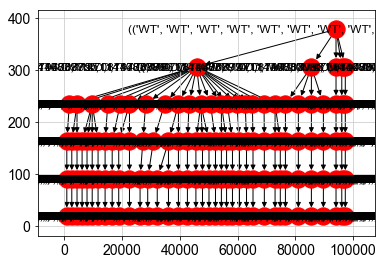

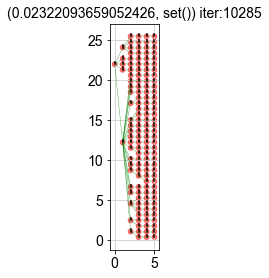

In [33]:
x, y, z, f, p = makeTree('B11', showAllPlots = True)

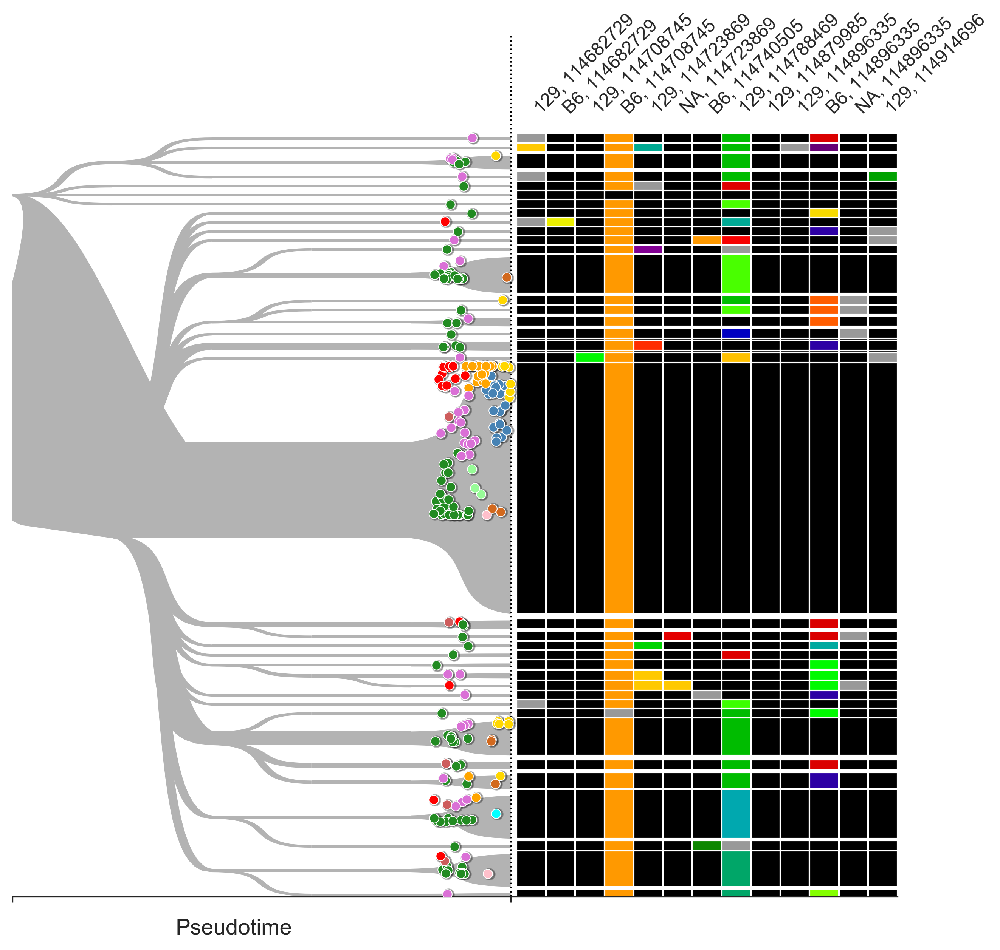

In [37]:
plotTree(x,y,z,f, p, figsize = (10,10))

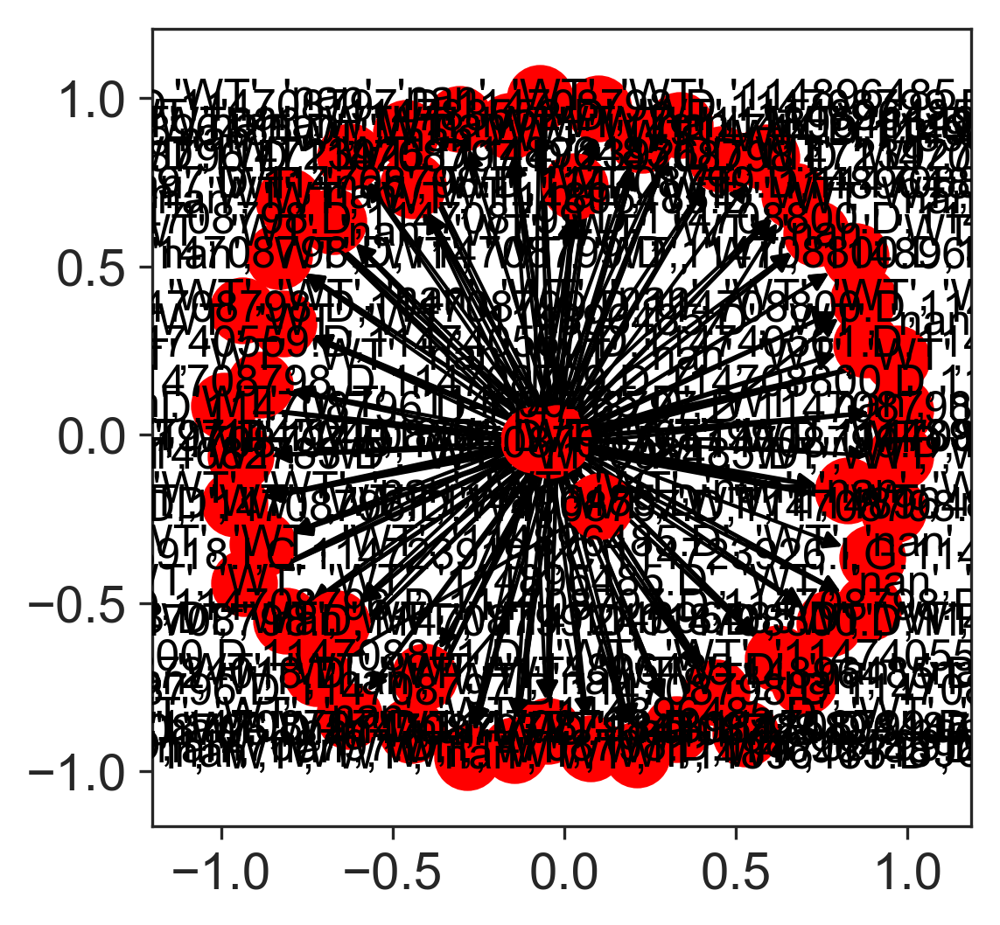

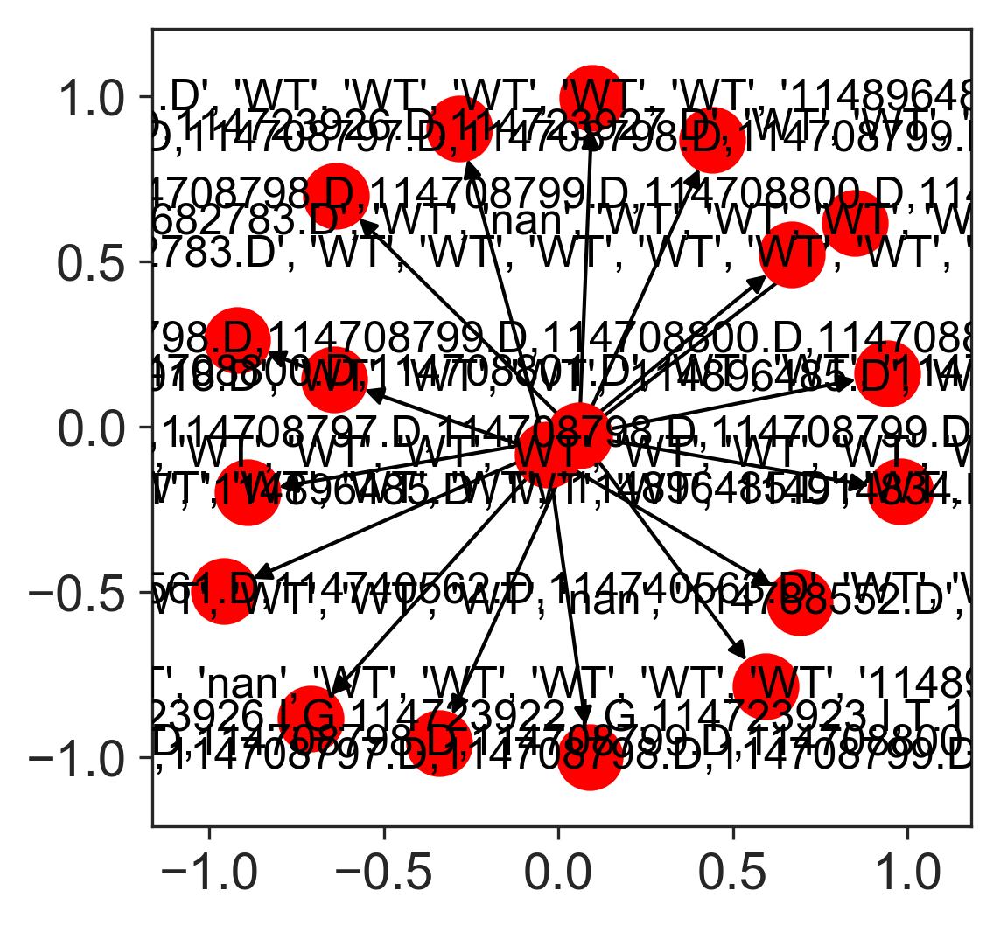

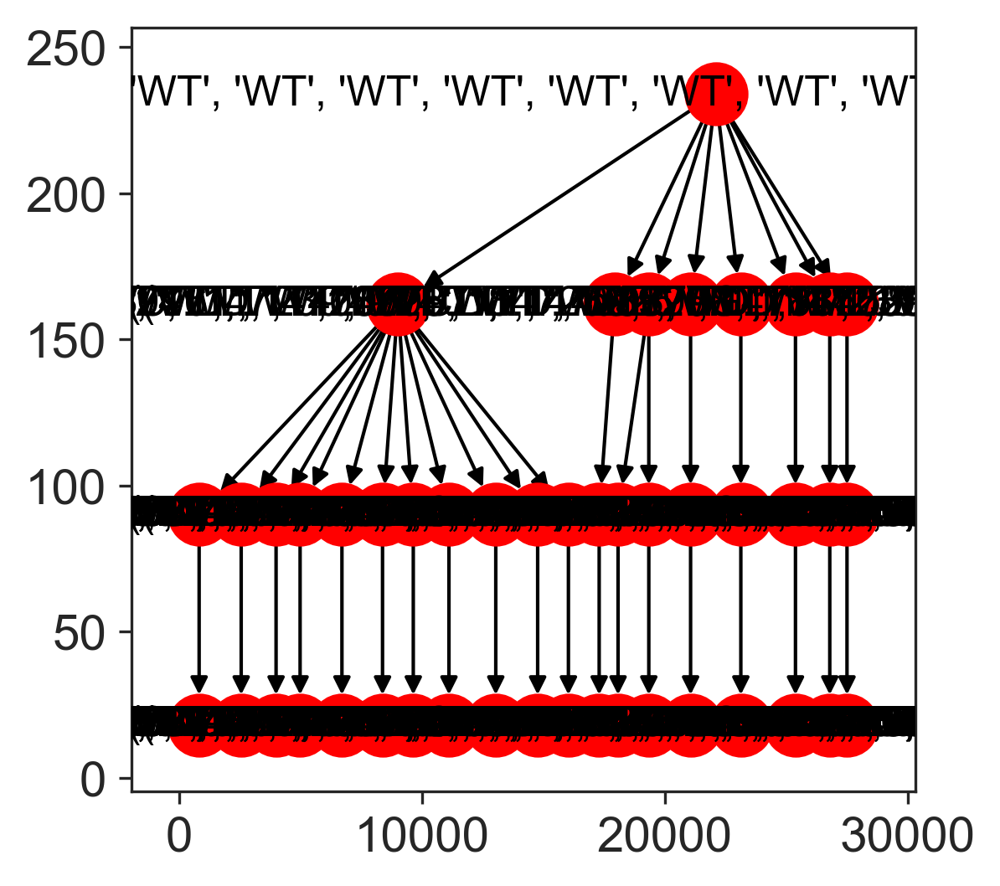

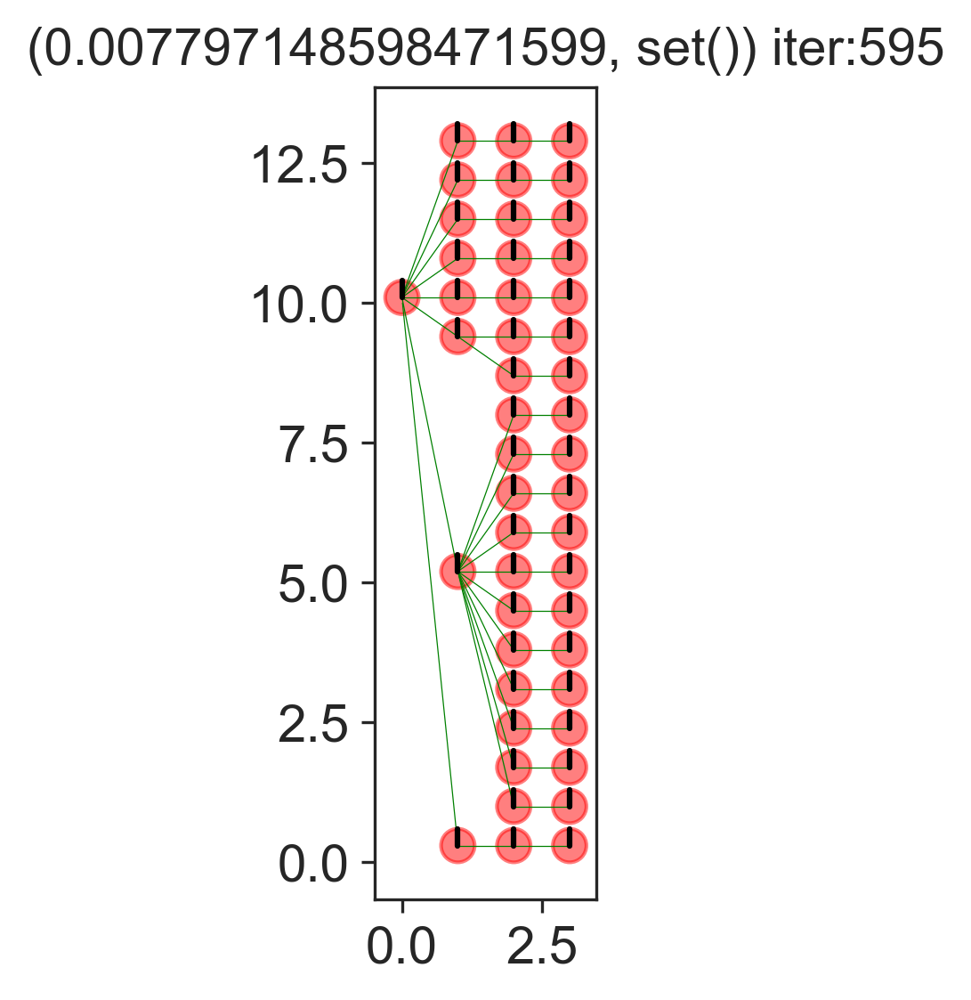

In [38]:
x2, y2, z2, f2, p2 = makeTree('B8', showAllPlots = True)

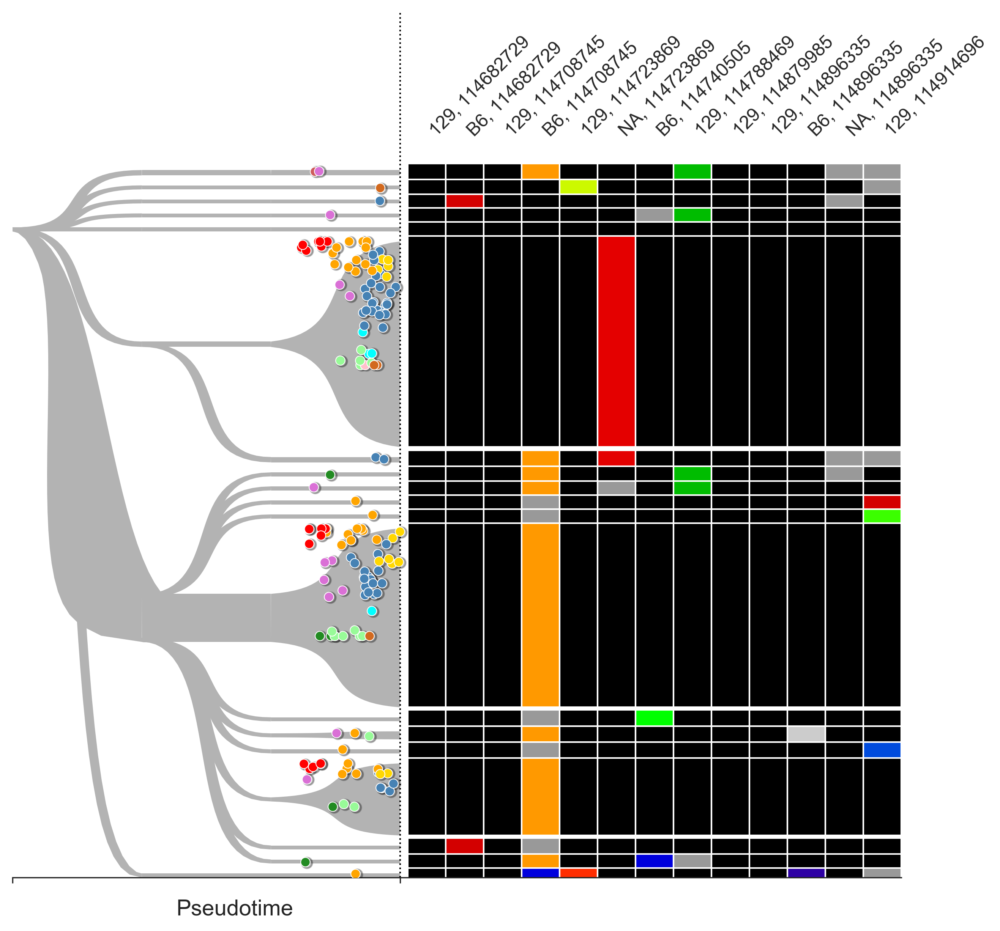

In [39]:
plotTree(x2,y2,z2,f2,p2, figsize = (10,10))

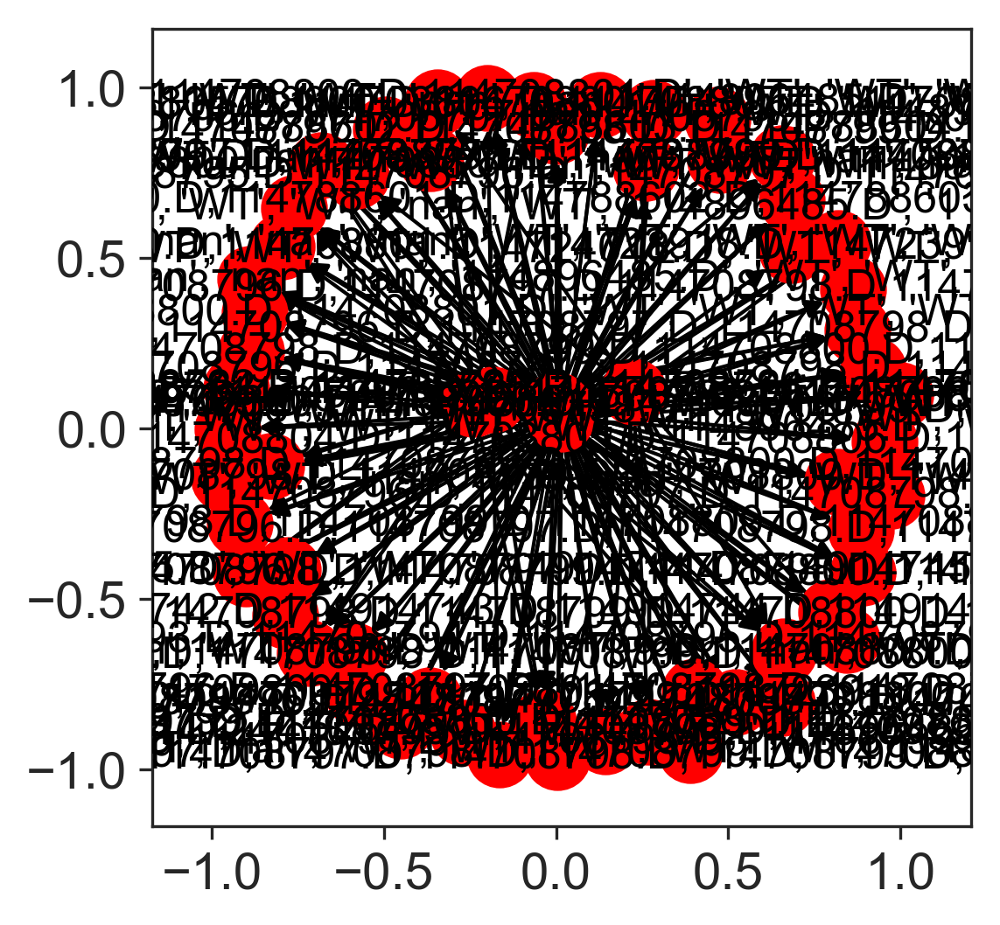

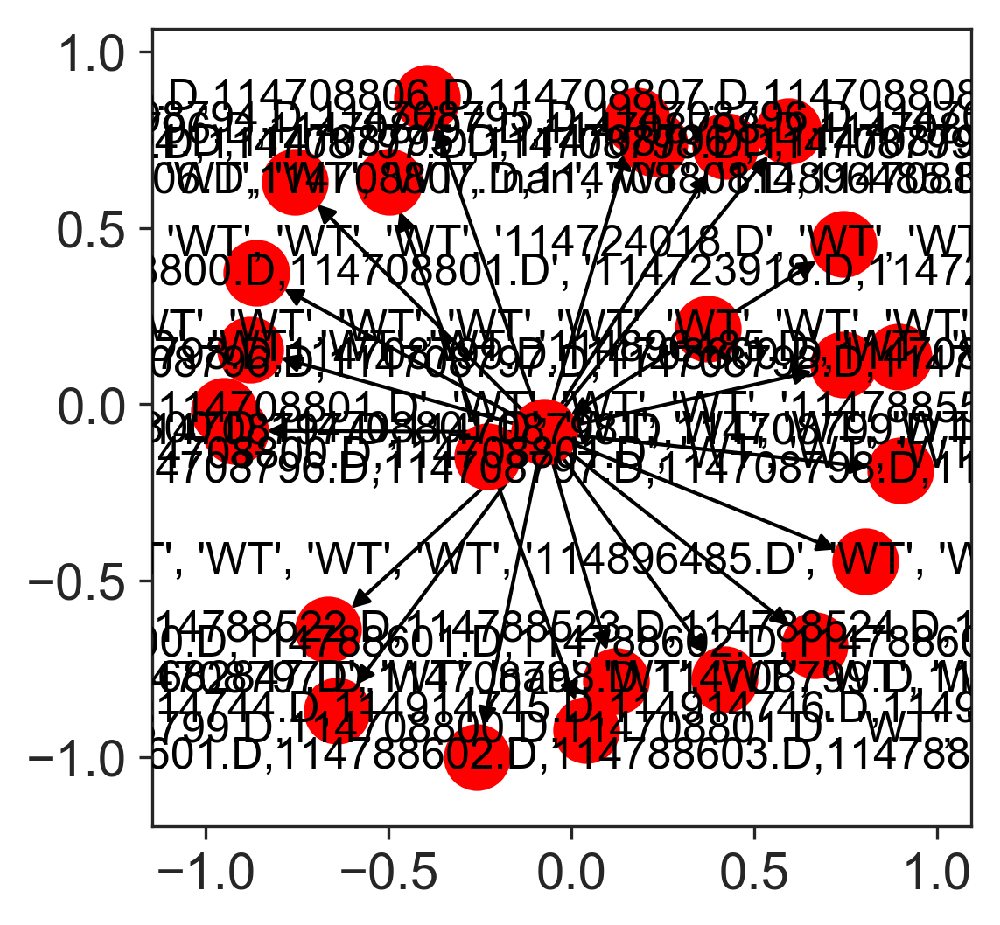

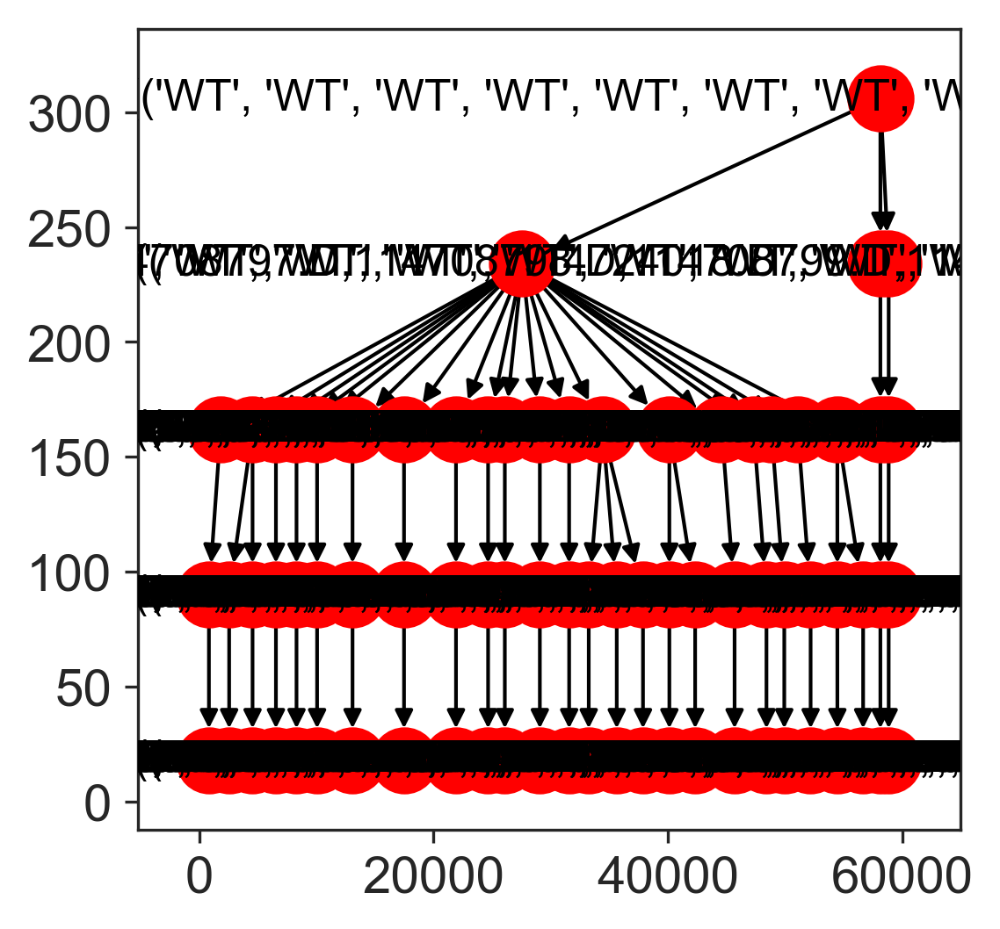

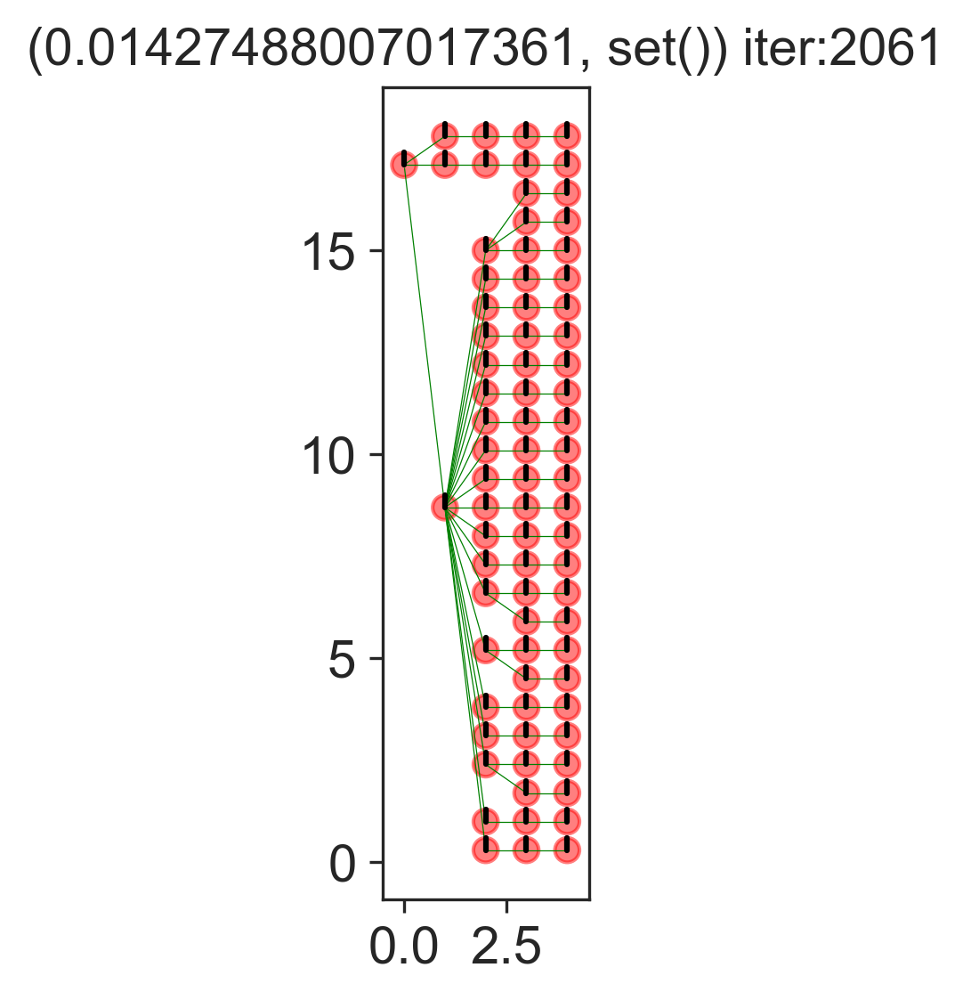

In [40]:
x3, y3, z3, f3, p3 = makeTree('A8', showAllPlots = True)

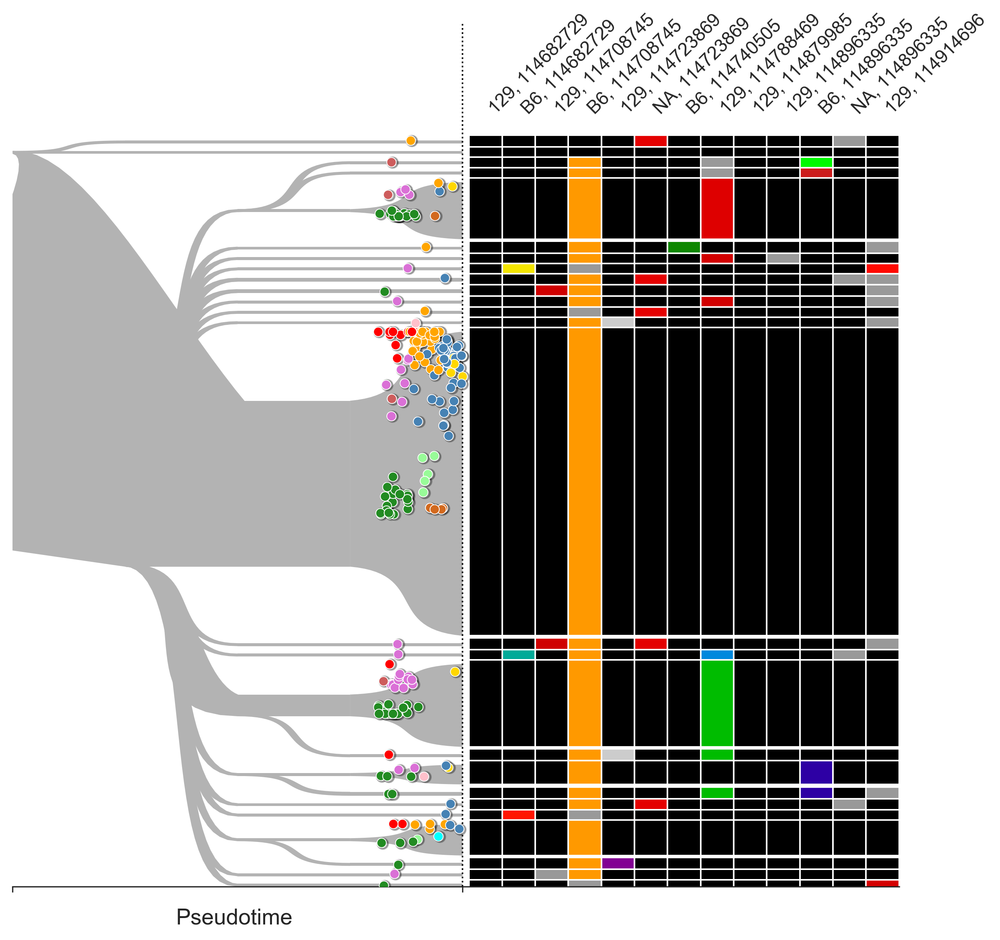

In [41]:
plotTree(x3,y3,z3,f3, p3, figsize = (10,10))

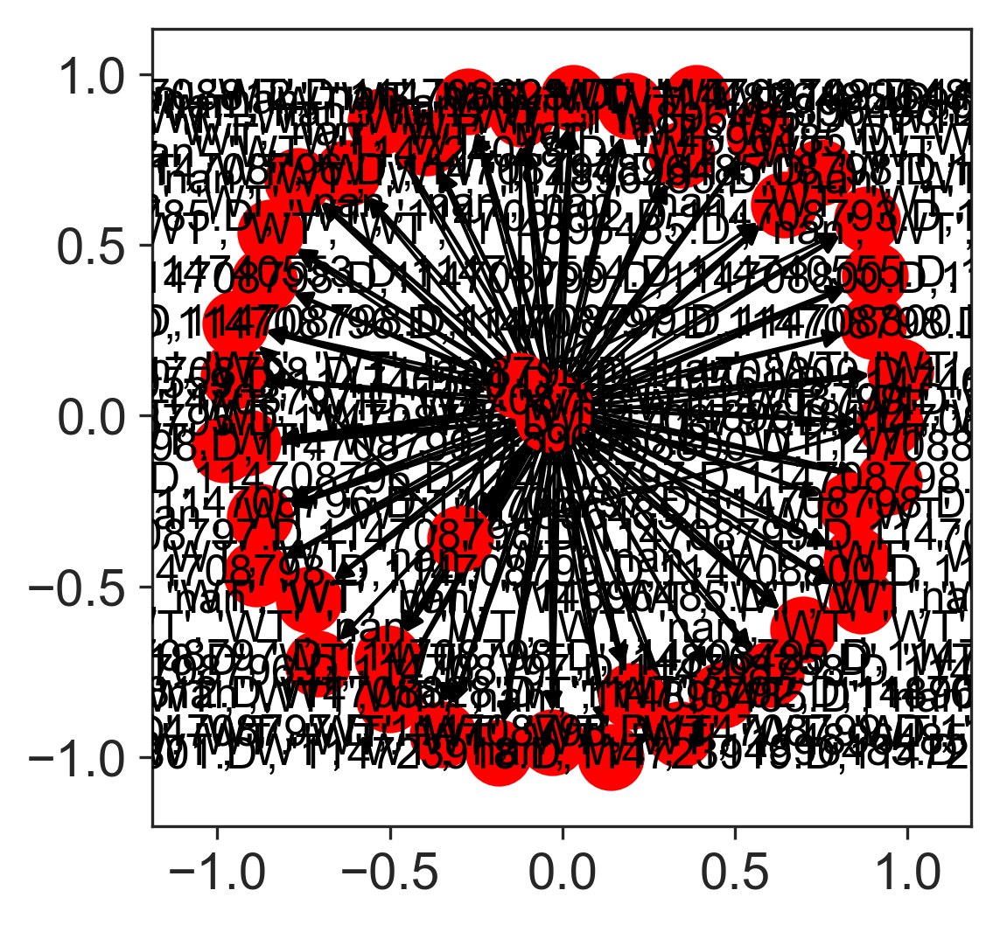

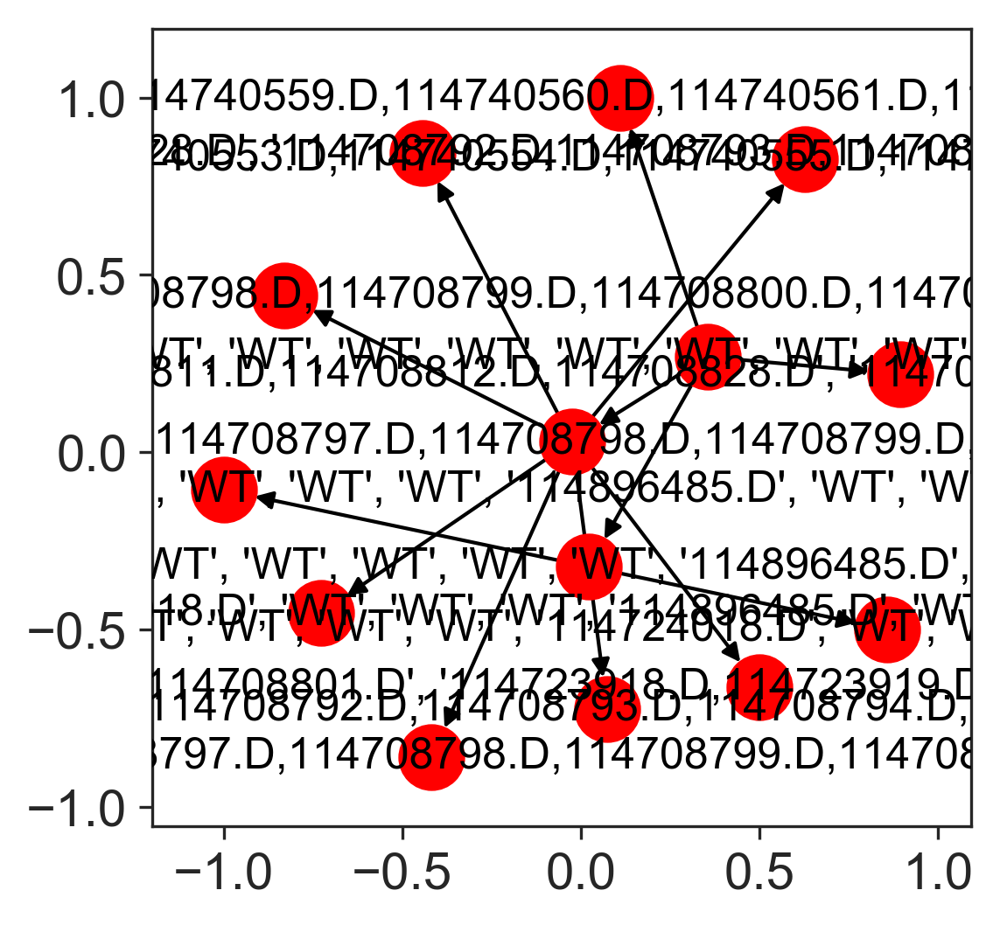

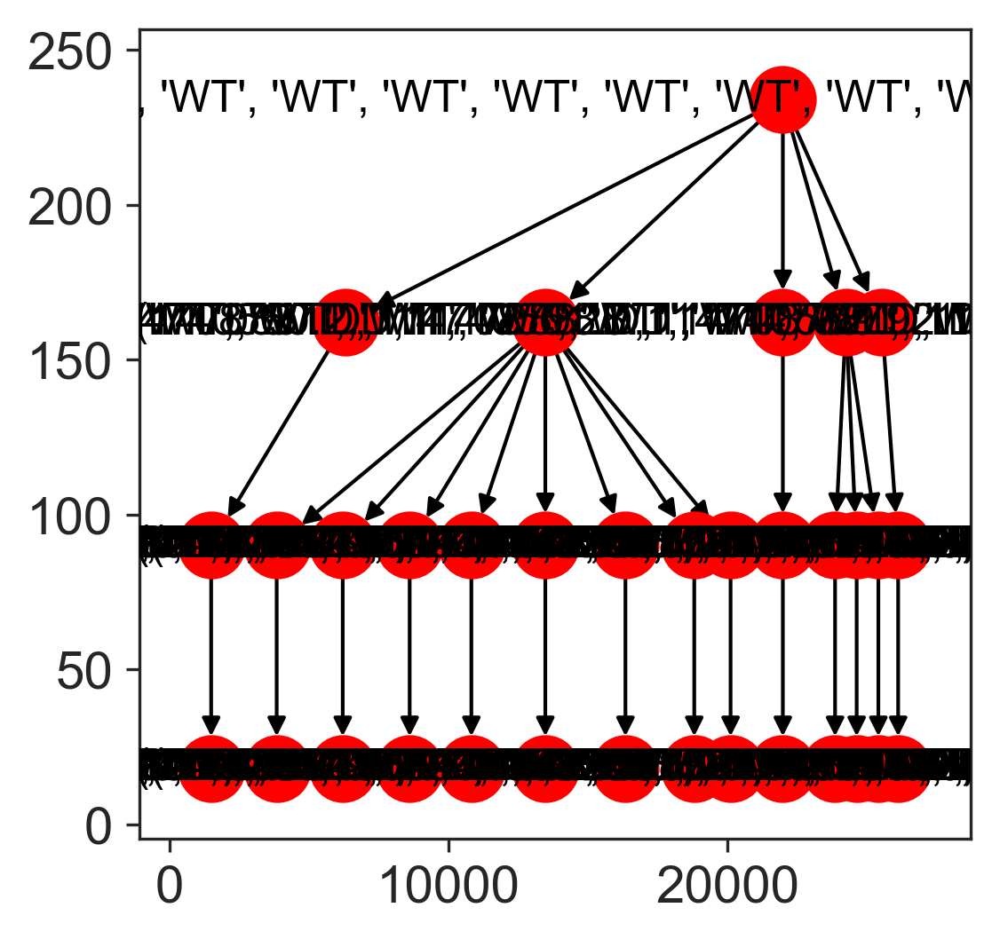

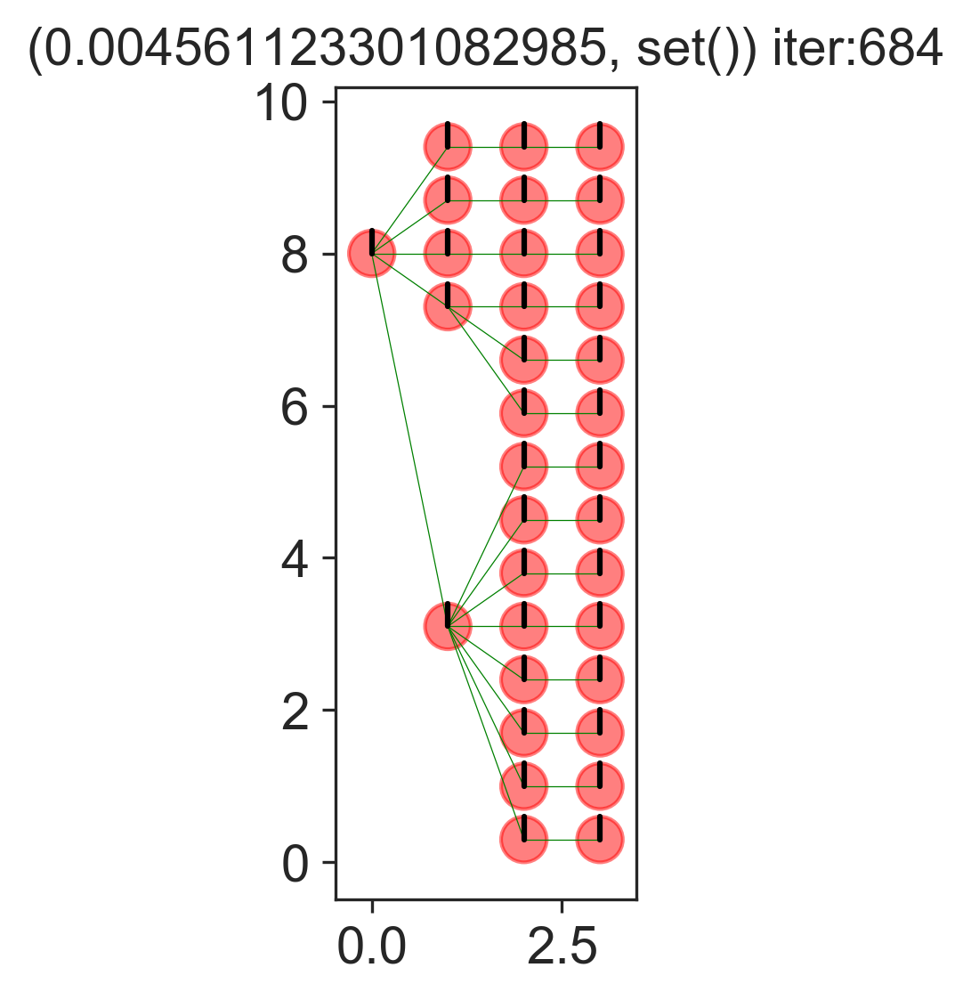

In [42]:
x4, y4, z4, f4, p4 = makeTree('C1', showAllPlots = True)

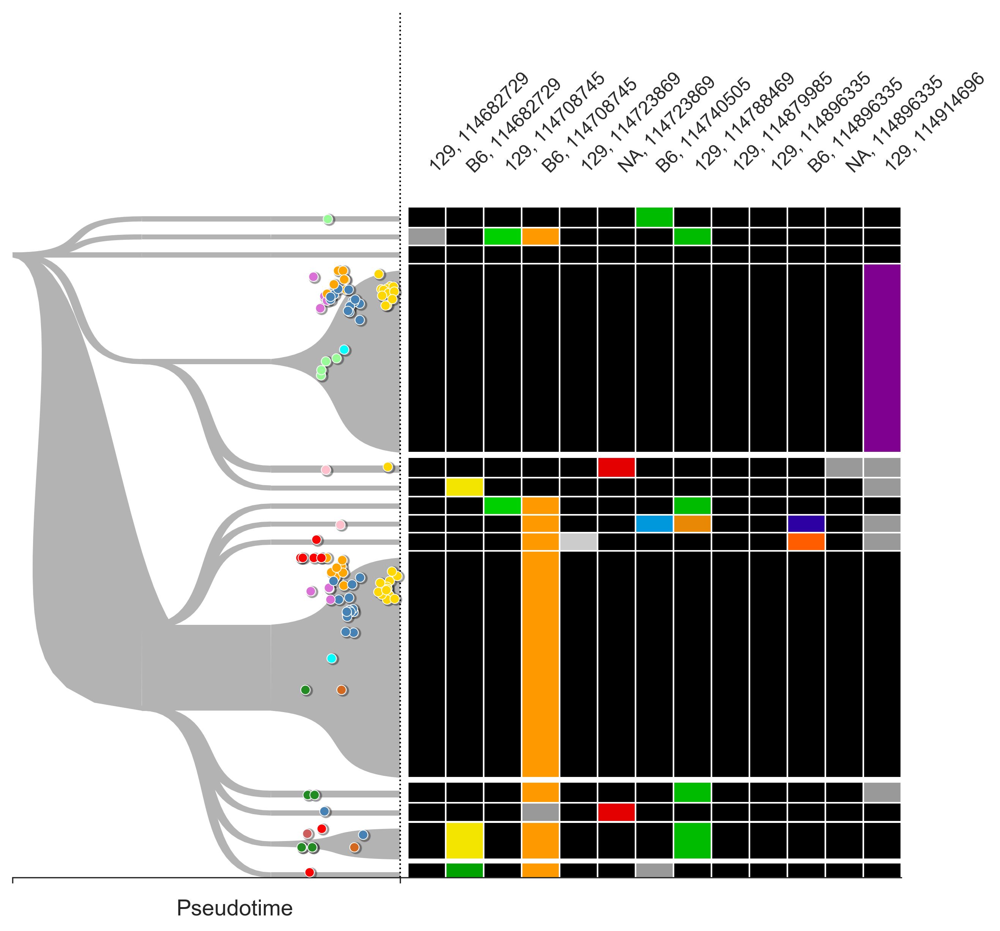

In [43]:
plotTree(x4,y4,z4,f4, p4, figsize = (10,10))

# Determine which gastruloids are present in the data and run the tree building for each gastruloid

Check the amount of cells for each gastruloid

In [41]:
collections.Counter([gastruloid for gastruloid, cell in df.index]) #groupby('')

Counter({'A8': 1149, 'B11': 1086, 'B8': 1142, 'C1': 1129})

First we can check the scar heatmap only, to see if the colours are divergent enough and to check the coverage. The scar colours in the heatmap and later on in the trees will be identical.

In [42]:
import scanpy as sc
sc.set_figure_params(dpi=300, color_map = 'viridis')
sns.set_style('white')
sns.set_style('ticks')

def plotHeatmap(df, figsize = (15,50), fontsize = 24):
    fig, ax = plt.subplots(1, figsize=figsize)
    columnsCount = df.shape[1]
    fontsize = fontsize
    sns.set_context("talk")
    rowHeight = 1
    rowColwidth = 1
    rowSpacing = 0.3
    for cellIndex, (cellName, row) in enumerate(df.iterrows()):
        for columnIndex,column in enumerate(df.columns):
            scarForThisCell = row[column]
            if not pd.isnull(scarForThisCell):
                ax.add_patch(
                matplotlib.patches.Rectangle(
                    (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                    rowColwidth, rowHeight-rowSpacing, color= scarColors[scarForThisCell])
            )

    ax.set_ylim(0,rowHeight*(df.shape[0]+1))
    ax.set_xlim(0,rowColwidth*(df.shape[1]))
    ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df.columns)])
    ax.set_xticklabels([column for columnIndex,column in enumerate(df.columns)],rotation=90)#, fontsize = 10)
    #ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df.index)])
    #ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df.index)],fontsize=6.5)
    ax.set_yticks([])
    ax.set_ylabel("Cells", fontsize = fontsize)
    #ax.set_title('All scars')
    ax.set_xlabel("Target sites", fontsize = fontsize)
    plt.setp(ax.xaxis.get_majorticklabels(), ha='right')
    ax.tick_params(axis = 'x',rotation=45)
    #sns.despine()
    return ax

def plotPercentagesAllele(gastruloid, site, fontsize = 18, df = percentagesChr12_129):

    fontsize = fontsize

    percentagepersite = []
    for cell in df[gastruloid]:
        percentagepersite.append(df[gastruloid][cell][site].dropna())

    percentagepersitepd = pd.DataFrame(percentagepersite)

    percentagepersitepd = percentagepersitepd.loc[percentagepersitepd.sum(axis = 1).sort_values(ascending=False).index]

    order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(percentagepersitepd.fillna(0)))
    orderedpercentagepersitepd = percentagepersitepd.iloc[order]
    missingvalueslast = pd.concat([orderedpercentagepersitepd[orderedpercentagepersitepd.sum(axis=1) != 0], orderedpercentagepersitepd[orderedpercentagepersitepd.sum(axis=1) == 0]])

    ax = missingvalueslast.plot.bar(stacked=True,figsize=(12,4),fontsize = 15,width=0.90, edgecolor = "none", 
                                    color=[scarColors[r] for r in missingvalueslast.columns])


    ax.set_xlabel("Cells",fontsize=fontsize)
    ax.set_title(('Site ' + str(site) + ', gastruloid ' + gastruloid + ', allele 129'), fontsize=fontsize)
    ax.set_ylabel("Percentage",fontsize=fontsize)
    ax.set_xticks([])
    #ax.set_yticks([])
    ax.legend([],frameon=False)
    sns.despine()
    #ax.legend(bbox_to_anchor=(0.9,-0.1))

def plotAlleleCounts(gastruloid, site, df = alleleCountsChr12_129PD, fontsize = 18):
    
    fontsize = fontsize

    percentagepersite = []
    for cell in df[gastruloid]:
        percentagepersite.append(df[gastruloid][cell][site].dropna())

    percentagepersitepd = pd.DataFrame(percentagepersite)

    percentagepersitepd = percentagepersitepd.loc[percentagepersitepd.sum(axis = 1).sort_values(ascending=False).index]

    order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(percentagepersitepd.fillna(0)))
    orderedpercentagepersitepd = percentagepersitepd.iloc[order]
    missingvalueslast = pd.concat([orderedpercentagepersitepd[orderedpercentagepersitepd.sum(axis=1) != 0], orderedpercentagepersitepd[orderedpercentagepersitepd.sum(axis=1) == 0]])

    ax = missingvalueslast.plot.bar(stacked=True,figsize=(12,4),fontsize = 15,width=0.90, edgecolor = "none", 
                                    color=[scarColors[r] for r in missingvalueslast.columns])


    ax.set_xlabel("Cells",fontsize=fontsize)
    ax.set_title(('Site ' + str(site) + ', gastruloid ' + gastruloid + ', allele 129'), fontsize=fontsize)
    ax.set_ylabel("Allele count",fontsize=fontsize)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend([],frameon=False)
    sns.despine()
    #ax.legend(bbox_to_anchor=(0.9,-0.1))
    
    return ax



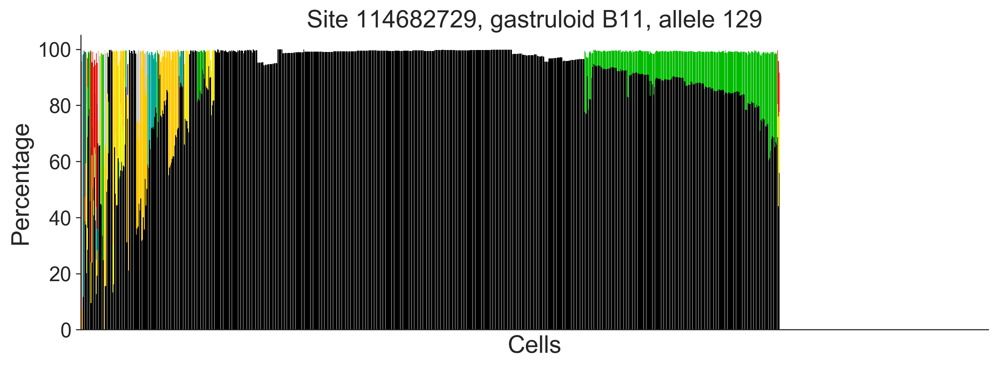

In [43]:
plotPercentagesAllele('B11', 114682729)

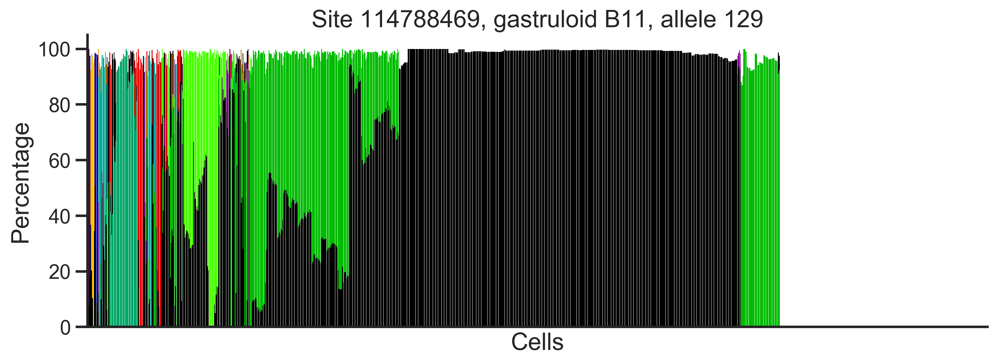

In [54]:
plotPercentagesAllele('B11',114788469)

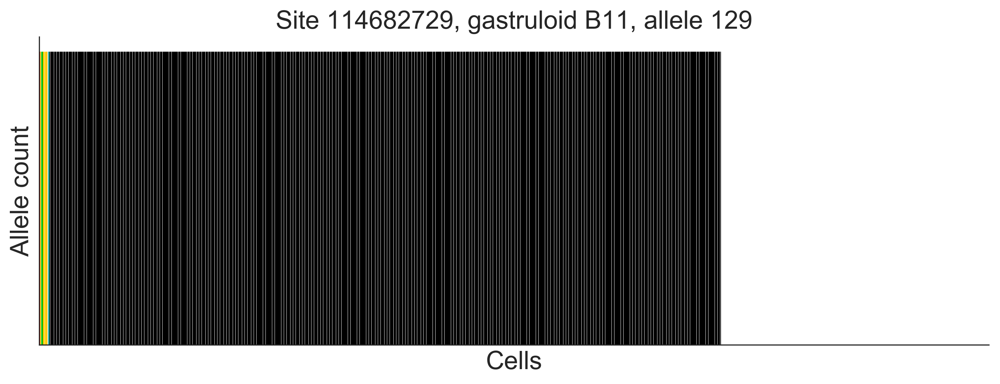

In [44]:
plotAlleleCounts('B11', 114682729)

In [45]:
# Determine organisation of the plot, based on site-allele with most information
selectionAll = selectionAll.sort_values([selectionAll.columns[0],selectionAll.columns[1],selectionAll.columns[5]])



In [46]:
#reorder
df_ts = df[found_targetsites]
df_ts = pd.concat([df_ts[selectionAll.columns], df_ts.drop(columns = selectionAll.columns)], axis = 1)
df_ts = df_ts.sort_values([df_ts.columns[0],df_ts.columns[1],df_ts.columns[2]])



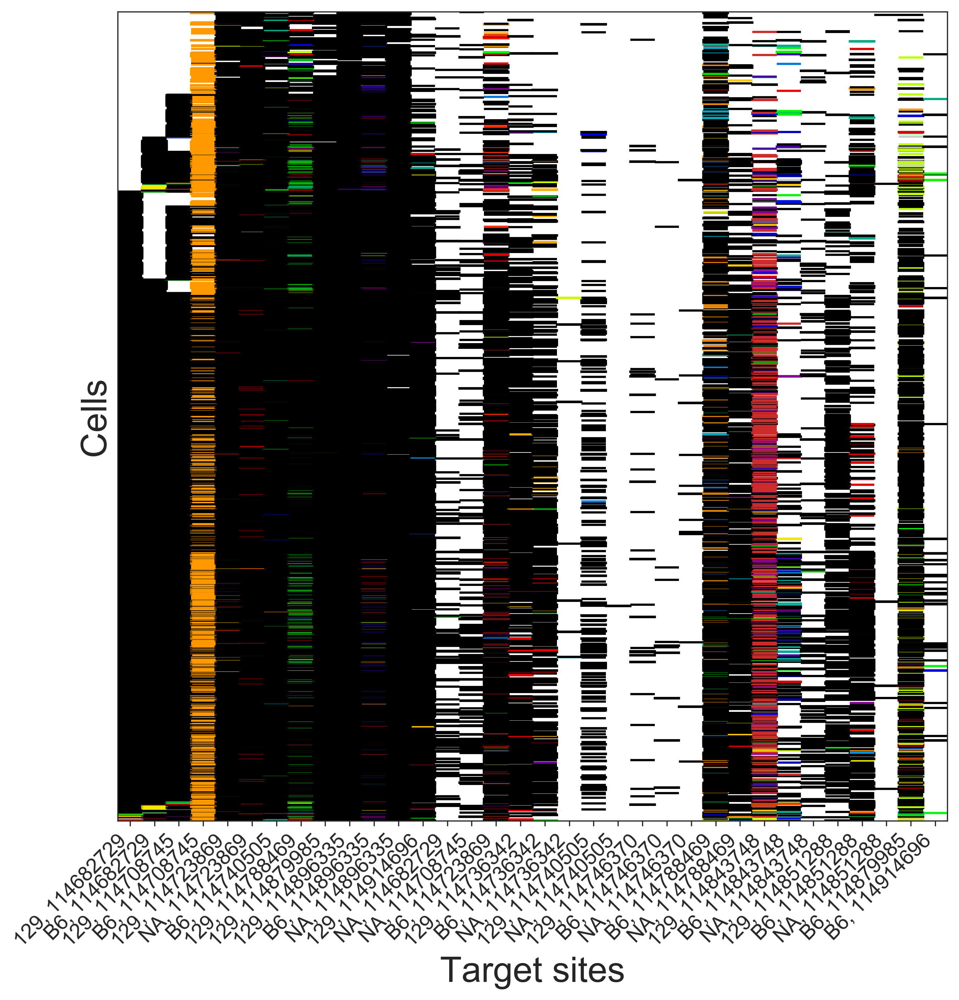

In [47]:
plotHeatmap(df_ts, (10,10))

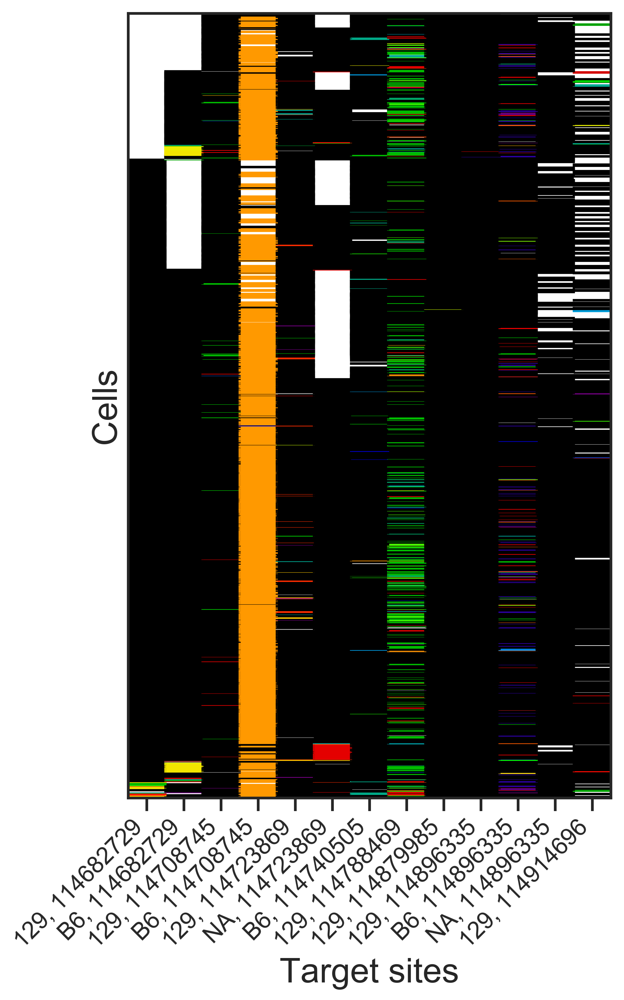

In [48]:
plotHeatmap(selectionAll, (6,10))

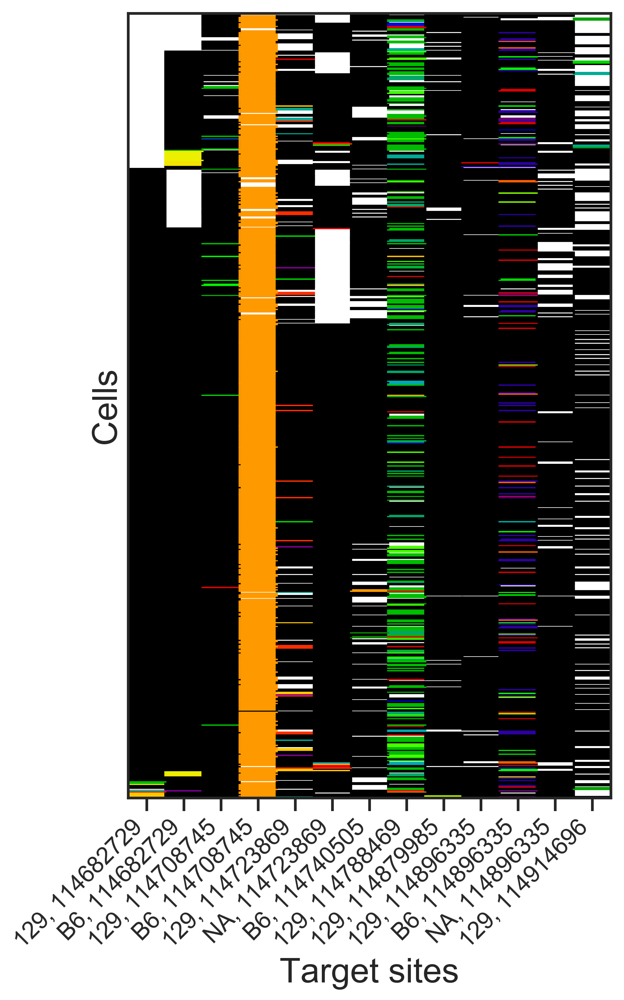

In [49]:
plotHeatmap(selectionAll.loc['B11'], (6,10))

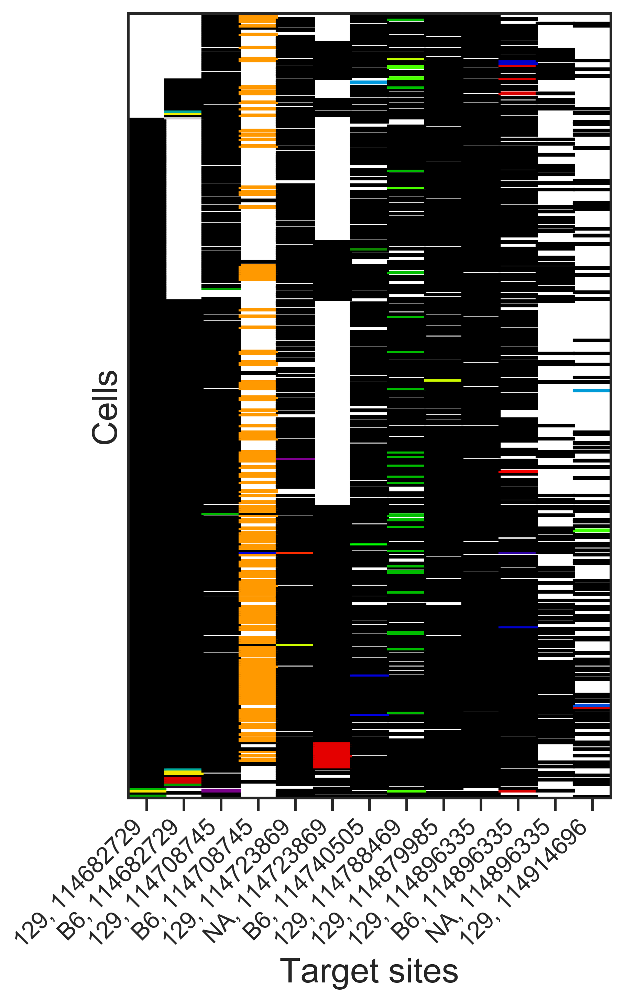

In [50]:
plotHeatmap(selectionAll.loc['B8'], (6,10))

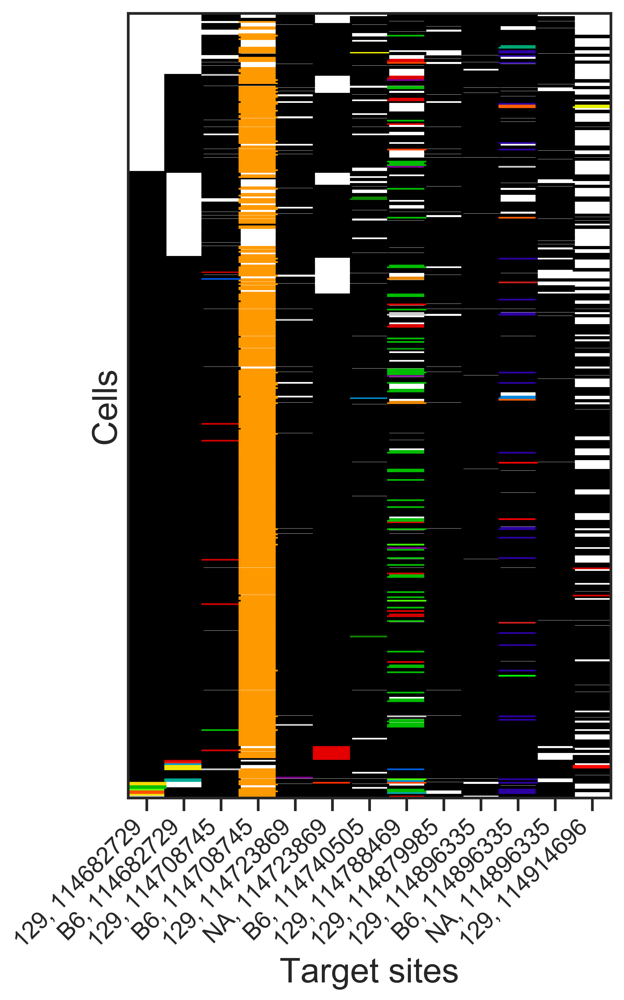

In [51]:
plotHeatmap(selectionAll.loc['A8'], (6,10))

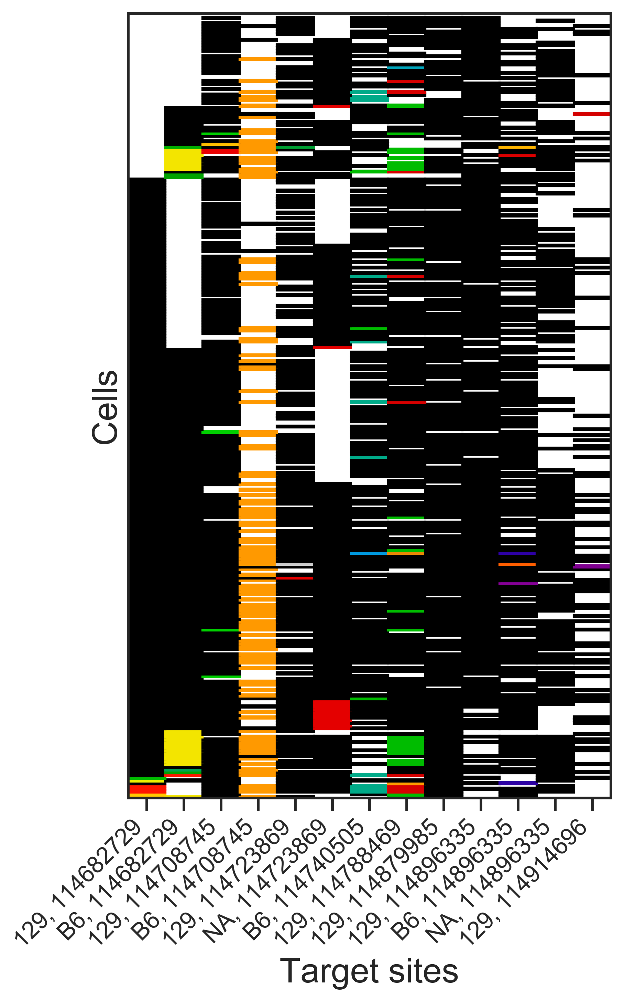

In [52]:
plotHeatmap(selectionAll.loc['C1'], (6,10))